## 0. Setup

In [2]:
%matplotlib ipympl
import matplotlib.pyplot as plt
plt.ioff()

In [3]:
import numpy as np
import torch
import torchvision
import torchvision.transforms as T

from EIANN import Network
import EIANN.utils as ut
import EIANN.plot as pt
import pprint

pt.update_plot_defaults()


# Load dataset
tensor_flatten = T.Compose([T.ToTensor(), T.Lambda(torch.flatten)])
MNIST_train_dataset = torchvision.datasets.MNIST(root='../data/mnist/datasets/MNIST_data/', train=True, download=False,
                                         transform=tensor_flatten)
MNIST_test_dataset = torchvision.datasets.MNIST(root='../data/mnist/datasets/MNIST_data/',
                                        train=False, download=False,
                                        transform=tensor_flatten)

# Add index to train & test data
MNIST_train = []
for idx,(data,target) in enumerate(MNIST_train_dataset):
    target = torch.eye(len(MNIST_train_dataset.classes))[target]
    MNIST_train.append((idx, data, target))
    
MNIST_test = []
for idx,(data,target) in enumerate(MNIST_test_dataset):
    target = torch.eye(len(MNIST_test_dataset.classes))[target]
    MNIST_test.append((idx, data, target))
    
# Put data in dataloader
data_generator = torch.Generator()
train_dataloader = torch.utils.data.DataLoader(MNIST_train[0:50000], shuffle=True, generator=data_generator)
val_dataloader = torch.utils.data.DataLoader(MNIST_train[-10000:], batch_size=10000, shuffle=False)
test_dataloader = torch.utils.data.DataLoader(MNIST_test, batch_size=10000, shuffle=False)

epochs = 1
data_seed = 257
network_seed = 66049

/Users/aaronmil/src/EIANN/EIANN/utils/data_utils.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
def plot_network_state(network, test_dataloader, title=None):
    
    pt.plot_batch_accuracy(network, test_dataloader, title=title)
    
    for layer in network:
        for population in layer:
            for projection in population:
                fig = plt.figure()
                plt.imshow(projection.weight.data, aspect='auto', interpolation='none')
                plt.suptitle('%s Weights: %s' % (title, projection.name))
                plt.colorbar()
                fig.show()

    for layer in network:
        for population in layer:
            fig = plt.figure()
            plt.imshow(torch.atleast_2d(population.activity.detach().T), aspect='auto', interpolation='none')
            plt.suptitle('%s Activity: %s' % (title, population.fullname))
            plt.colorbar()
            fig.show()

In [5]:
def get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps, data_file_path=None, store_params=False):
        
    if data_file_path is not None:
        network = ut.load_network(data_file_path)
    else:
        network_config = ut.read_from_yaml(config_file_path)
        layer_config = network_config['layer_config']
        projection_config = network_config['projection_config']
        training_kwargs = network_config['training_kwargs']
        
        network = Network(layer_config, projection_config, seed=network_seed, **training_kwargs)
        network.train(train_dataloader, val_dataloader, samples_per_epoch=train_steps, val_interval=(0, -1, 100), store_history=True, \
                      store_dynamics=True, store_params=store_params, status_bar=True)

    return network

In [6]:
def plot_mnist_network_accuracy(network, test_dataloader, supervised=True):
    if not supervised:
        _, sorted_output_idx = ut.sort_by_val_history(network)
    else:
        sorted_output_idx = torch.arange(0, network.val_output_history.shape[-1])
    pt.plot_batch_accuracy(network, test_dataloader, population='all', sorted_output_idx=sorted_output_idx, title='Final')
    pt.plot_train_loss_history(network)
    pt.plot_validate_loss_history(network)

In [11]:
def plot_mnist_network_intermediates(network):

    fig, axes = plt.subplots(5, 3, figsize=(10., 12.))
    try:
        im = axes[0][0].imshow(network.H1.E.plateau_history.T, aspect='auto', interpolation='none')
        plt.colorbar(im, ax=axes[0][0])
        axes[0][0].set_title('Plateau history: H1.E')
        axes[0][0].set_ylabel('Unit ID')
        axes[0][0].set_xlabel('Training steps')
        
        im = axes[0][1].imshow(network.H2.E.plateau_history.T, aspect='auto', interpolation='none')
        plt.colorbar(im, ax=axes[0][1])
        axes[0][1].set_title('Plateau history: H2.E')
        axes[0][1].set_ylabel('Unit ID')
        axes[0][1].set_xlabel('Training steps')
        
        im = axes[0][2].imshow(network.Output.E.plateau_history.T, aspect='auto', interpolation='none')
        plt.colorbar(im, ax=axes[0][2])
        axes[0][2].set_title('Plateau history: Output.E')
        axes[0][2].set_xlabel('Training steps')
        
        binned_Output_E_plateau_prob = network.Output.E.plateau_history.T.reshape(network.Output.E.plateau_history.T.shape[0], -1, 100).mean(dim=(0,2))
        binned_H1_E_plateau_prob = network.H1.E.plateau_history.T.reshape(network.H1.E.plateau_history.T.shape[0], -1, 100).mean(dim=(0,2))
        binned_H2_E_plateau_prob = network.H2.E.plateau_history.T.reshape(network.H2.E.plateau_history.T.shape[0], -1, 100).mean(dim=(0,2))
        binned_train_steps = torch.arange(1, len(binned_H1_E_plateau_prob) + 1) * 100

        axes[1][0].plot(binned_train_steps, binned_H1_E_plateau_prob)
        axes[1][1].plot(binned_train_steps, binned_H2_E_plateau_prob)
        axes[1][2].plot(binned_train_steps, binned_Output_E_plateau_prob)
        axes[1][0].set_ylabel('Mean plateau amp')
        axes[1][0].set_xlabel('Training steps')
        axes[1][1].set_xlabel('Training steps')
        axes[1][2].set_xlabel('Training steps')
        axes[1][0].set_title('Plateau_history: H1.E')
        axes[1][1].set_title('Plateau_history: H2.E')
        axes[1][2].set_title('Plateau_history: Output.E')
    
        # if isinstance(network.H1.E.forward_dendritic_state_history,  list):
        #     network.H1.E.forward_dendritic_state_history = torch.stack(network.H1.E.forward_dendritic_state_history)
        # if isinstance(network.H1.E.backward_dendritic_state_history,  list):
        #     network.H1.E.backward_dendritic_state_history = torch.stack(network.H1.E.backward_dendritic_state_history)

        binned_H1_E_forward_dend_state = network.H1.E.forward_dendritic_state_history.T.reshape(network.H1.E.forward_dendritic_state_history.T.shape[0], -1, 100).abs().mean(dim=(0,2))
        binned_H1_E_backward_dend_state = network.H1.E.backward_dendritic_state_history.T.reshape(network.H1.E.backward_dendritic_state_history.T.shape[0], -1, 100).abs().mean(dim=(0,2))

        binned_train_steps = torch.arange(1, len(binned_H1_E_backward_dend_state) + 1) * 100

        axes[2][0].plot(binned_train_steps, binned_H1_E_forward_dend_state)
        axes[2][0].set_title('Forward dendritic state: H1.E')
        axes[2][0].set_xlabel('Training steps')
        axes[2][0].set_ylabel('Mean amplitude')

        axes[2][1].plot(binned_train_steps, binned_H1_E_backward_dend_state)
        axes[2][1].set_title('Backward dendritic state: H1.E')
        axes[2][1].set_xlabel('Training steps')

        binned_H2_E_forward_dend_state = network.H2.E.forward_dendritic_state_history.T.reshape(network.H2.E.forward_dendritic_state_history.T.shape[0], -1, 100).abs().mean(dim=(0,2))
        binned_H2_E_backward_dend_state = network.H2.E.backward_dendritic_state_history.T.reshape(network.H2.E.backward_dendritic_state_history.T.shape[0], -1, 100).abs().mean(dim=(0,2))

        axes[3][0].plot(binned_train_steps, binned_H2_E_forward_dend_state)
        axes[3][0].set_title('Forward dendritic state: H2.E')
        axes[3][0].set_xlabel('Training steps')
        axes[3][0].set_ylabel('Mean amplitude')

        axes[3][1].plot(binned_train_steps, binned_H2_E_backward_dend_state)
        axes[3][1].set_title('Backward dendritic state: H2.E')
        axes[3][1].set_xlabel('Training steps')
    except: pass
    
    try:
        axes[4][0].plot(network.param_history_steps, torch.mean(network.H1.E.H1.DendI.weight_history, dim=(1,2)))
        axes[4][0].set_title('Weight history: H1.E.H1.DendI')
        axes[4][0].set_xlabel('Training steps')
        axes[4][0].set_ylabel('Mean weight')
        
        axes[4][1].plot(network.param_history_steps, torch.mean(network.H2.E.H2.DendI.weight_history, dim=(1,2)))
        axes[4][1].set_title('Weight history: H2.E.H2.DendI')
        axes[4][1].set_xlabel('Training steps')
        axes[4][1].set_ylabel('Mean weight')
    except: pass
    
    try:
        axes[4][2].plot(network.param_history_steps, torch.mean(network.H2.E.Output.E.weight_history, dim=(1,2)))
        axes[4][2].set_title('Weight history: H2.E.Output.E')
        axes[4][2].set_xlabel('Training steps')
        axes[4][2].set_ylabel('Mean weight')
    except: pass

    fig.tight_layout()
    fig.show()
    
    for population in [network.H1.E, network.H2.E, network.Output.E]:
        receptive_fields = ut.compute_maxact_receptive_fields(population)
        if population is network.Output.E:
            sort = False
        else:
            sort = True
        pt.plot_receptive_fields(receptive_fields, sort=sort, num_cols=10, num_rows=2)
        metrics_dict = ut.compute_representation_metrics(population, test_dataloader, receptive_fields)
        pt.plot_representation_metrics(metrics_dict)

    try:
        from scipy.stats import pearsonr
        fig, axes = plt.subplots(1, 2)
        forward_weights = network.H2.E.H1.E.weight.data.flatten()
        backward_weights = network.H1.E.H2.E.weight.data.T.flatten()
        r, p = pearsonr(forward_weights, backward_weights)
        axes[0].scatter(forward_weights, backward_weights, label='r^2: %.2f, p: %.3f' % (r**2, p))
        axes[0].set_title('H1.E.H2.E')
        axes[0].set_xlabel('Forward weights')
        axes[0].set_ylabel('Backward weights')
        axes[0].legend(loc='best', frameon=False, framealpha=0.5)
        forward_weights = network.Output.E.H2.E.weight.data.flatten()
        backward_weights = network.H2.E.Output.E.weight.data.T.flatten()
        r, p = pearsonr(forward_weights, backward_weights)
        axes[1].scatter(forward_weights, backward_weights, label='r^2: %.2f, p: %.3f' % (r**2, p))
        axes[1].set_title('H2.E.Output.E')
        axes[1].set_xlabel('Forward weights')
        axes[1].set_ylabel('Backward weights')
        axes[1].legend(loc='best', frameon=False, framealpha=0.5)
        fig.show()

    except:
        pass

In [8]:
def print_activity(network, index, num_units=10):
    i = index
    print('Output:')
    print('Target:', network.target_history[i], '\n', 
          'Forward:', network.Output.E.activity_history[i], '\n', 
          'Backward:', network.Output.E.backward_activity_history[i], '\n', 
          'Plateau:', network.Output.E.plateau_history[i], '\n')
    print('H2:')
    print('Forward:', network.H2.E.activity_history[i][:num_units], '\n', 
          'Backward:', network.H2.E.backward_activity_history[i][:num_units], '\n', 
          'Plateau:', network.H2.E.plateau_history[i][:num_units], '\n')
    print('H1')
    print('Forward:', network.H1.E.activity_history[i][:num_units], '\n', 
          'Backward:', network.H1.E.backward_activity_history[i][:num_units], '\n', 
          'Plateau:', network.H1.E.plateau_history[i][:num_units], '\n')

## vanBP

Loading network from '../data/mnist/20231129_EIANN_2_hidden_mnist_van_bp_relu_SGD_config_G_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20231129_EIANN_2_hidden_mnist_van_bp_relu_SGD_config_G_66049_257_complete.pkl'
Batch accuracy = 96.11000061035156%


/Users/aaronmil/src/EIANN/EIANN/plot.py:747: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  avg_pop_activity = torch.tensor(avg_pop_activity)
/Users/aaronmil/src/EIANN/EIANN/plot.py:772: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/aaronmil/src/EIANN/EIANN/plot.py:209: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/aaronmil/src/EIANN/EIANN/plot.py:229: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/var/folders/1v/63_09y215ml8k3bkh1my_dfw0000gn/T/ipykernel_97707/731649133.py:90: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 23260947.98it/s]


Extracting /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw/train-images-idx3-ubyte.gz to /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 2664079.48it/s]

Extracting /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw/train-labels-idx1-ubyte.gz to /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw



Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 10978616.12it/s]


Extracting /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 2826068.65it/s]

Extracting /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to /Users/aaronmil/src/EIANN/EIANN/data/datasets/MNIST/raw



Optimizing receptive field images...


100%|██████████| 1000/1000 [00:05<00:00, 174.27it/s]
/Users/aaronmil/src/EIANN/EIANN/plot.py:622: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/aaronmil/src/EIANN/EIANN/plot.py:299: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Optimizing receptive field images...


100%|██████████| 1000/1000 [00:07<00:00, 134.40it/s]
/Users/aaronmil/src/EIANN/EIANN/plot.py:622: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/aaronmil/src/EIANN/EIANN/plot.py:299: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Optimizing receptive field images...


100%|██████████| 1000/1000 [00:01<00:00, 948.62it/s]
/Users/aaronmil/src/EIANN/EIANN/plot.py:622: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/aaronmil/src/EIANN/EIANN/plot.py:299: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


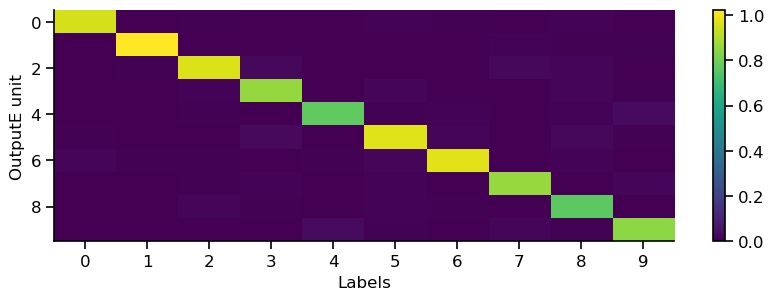

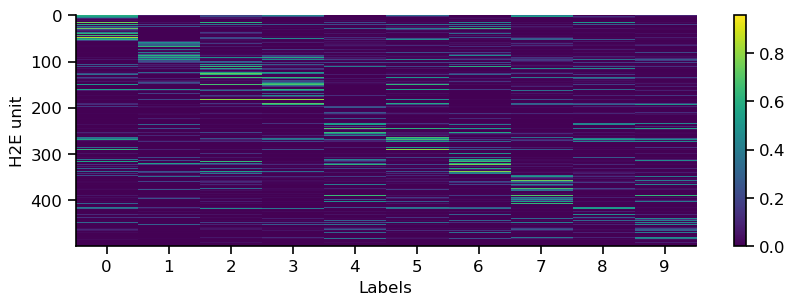

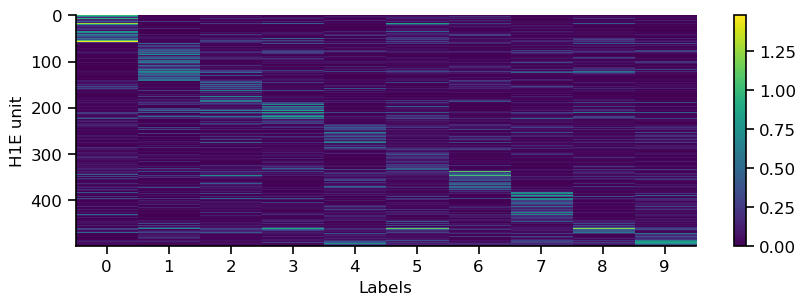

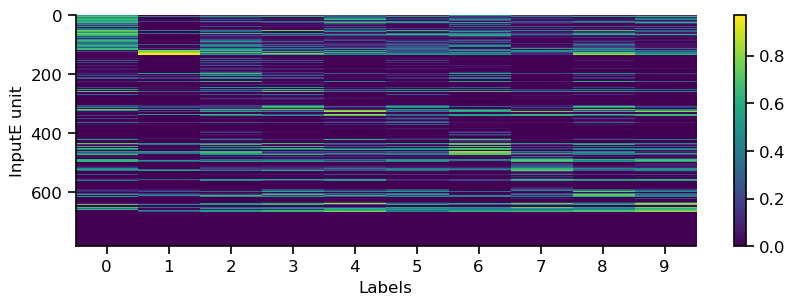

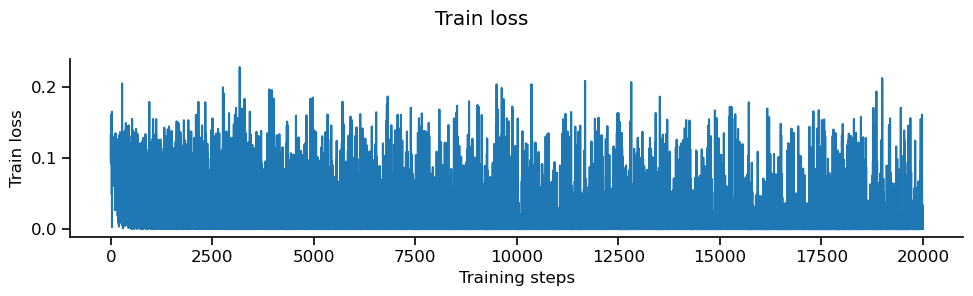

...

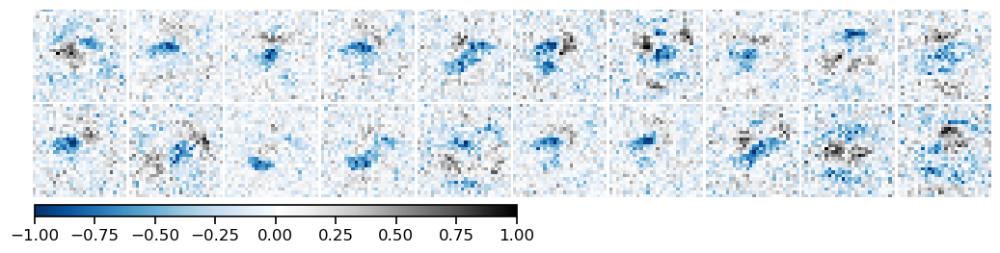

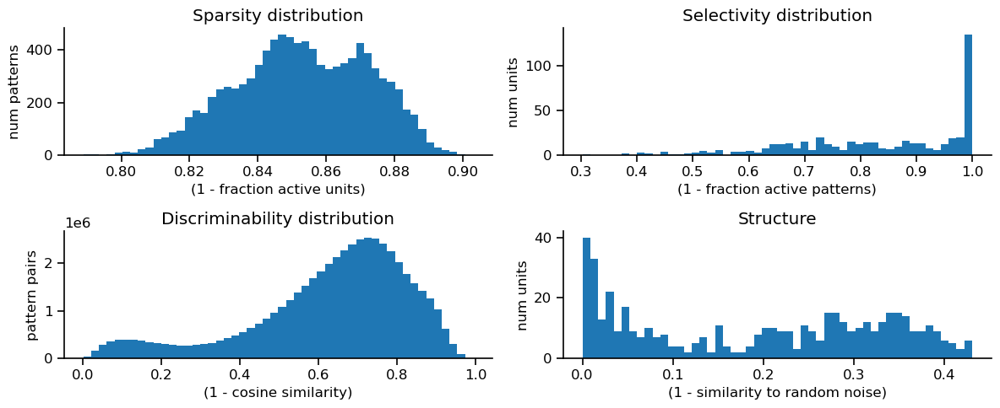

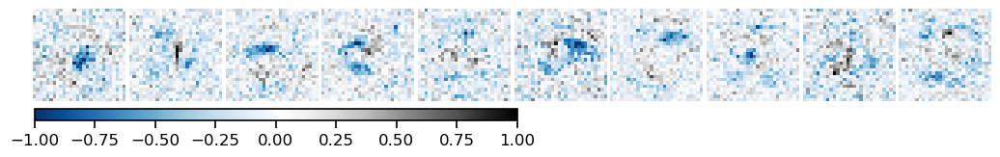

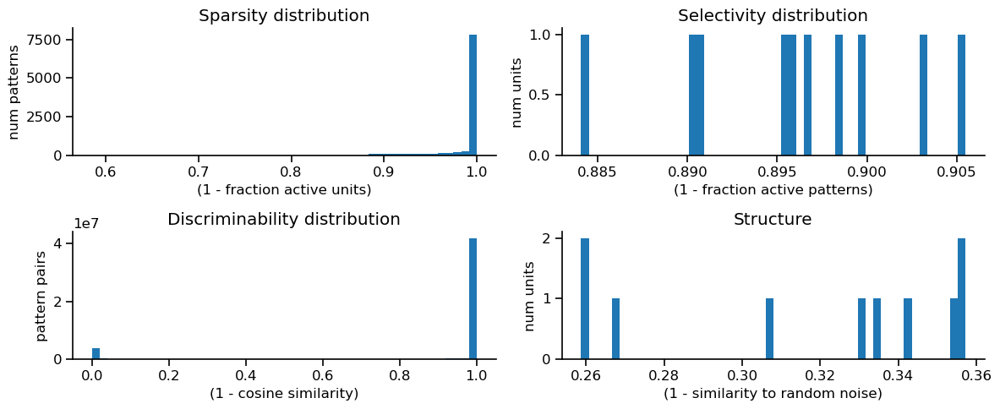

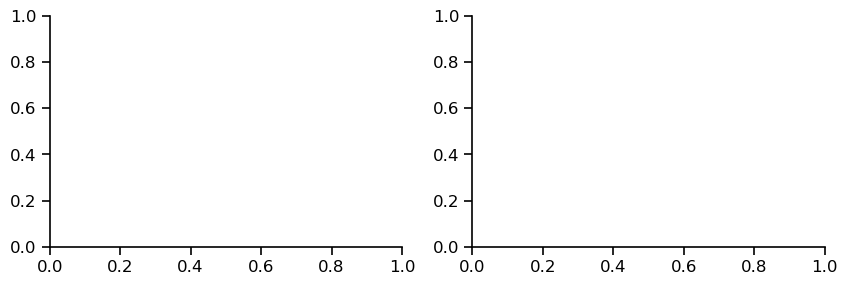

In [8]:
# Create network

config_file_path = '../network_config/mnist/20231129_EIANN_2_hidden_mnist_van_bp_relu_SGD_config_G_optimized.yaml'
data_file_path = '../data/mnist/20231129_EIANN_2_hidden_mnist_van_bp_relu_SGD_config_G_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                             data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

van_bp_network = network

## bpDale_relu_F

Loading network from '../data/mnist/20240419_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_F_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20240419_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_F_66049_257_complete.pkl'
Batch accuracy = 95.12000274658203%


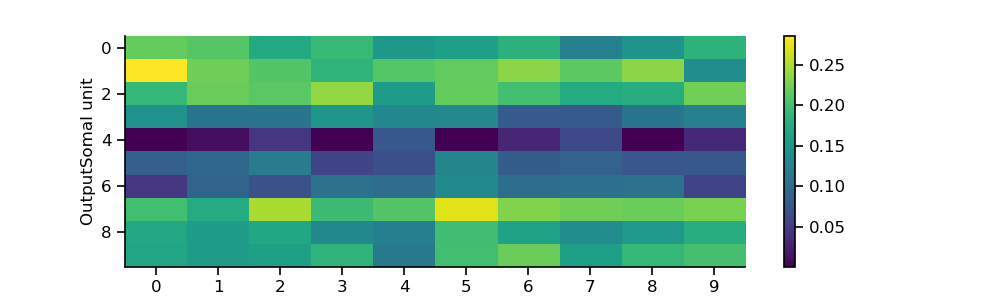

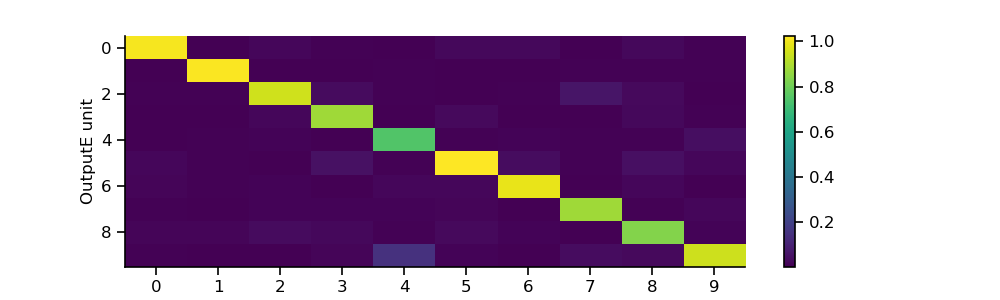

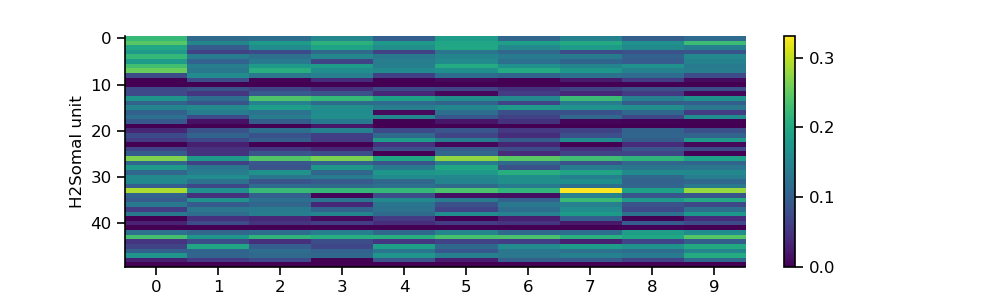

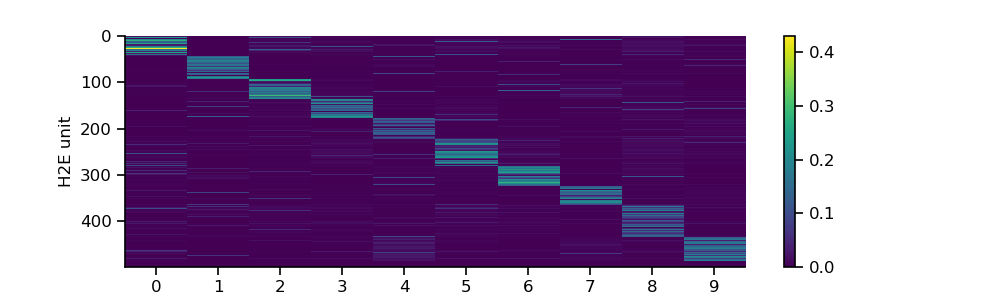

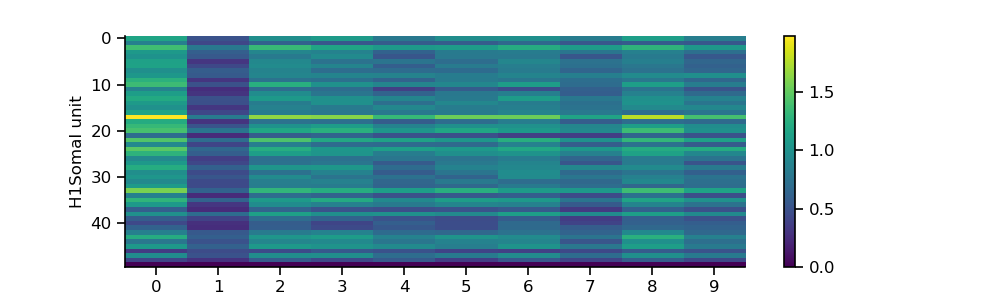

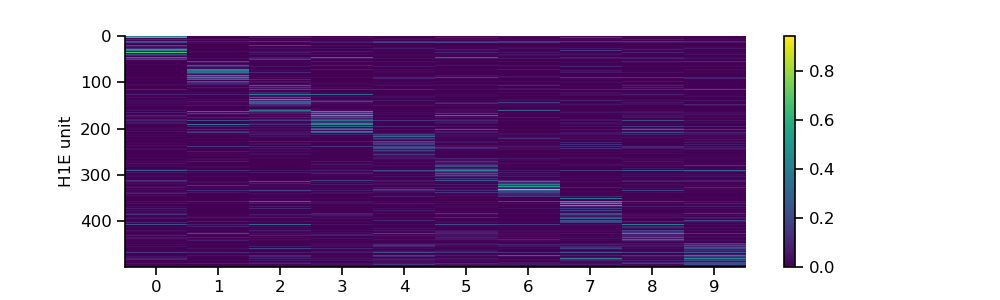

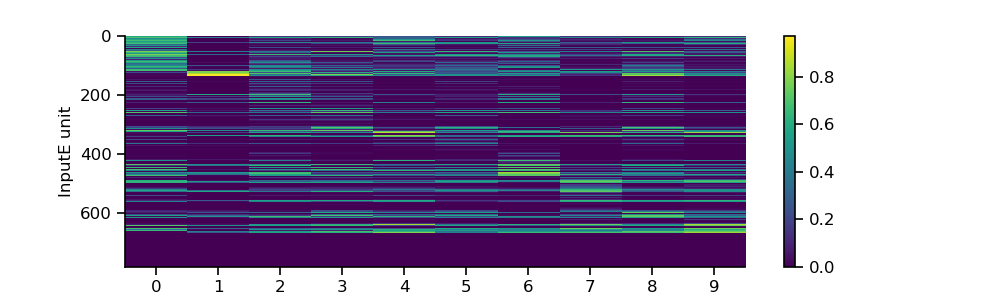

/Users/aaronmil/src/EIANN/EIANN/plot.py:203: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


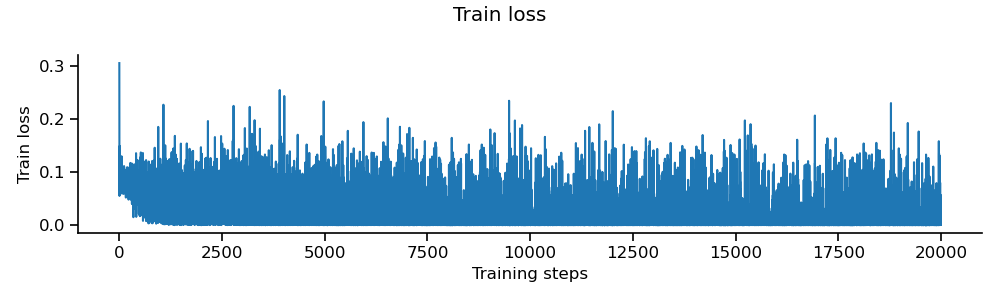

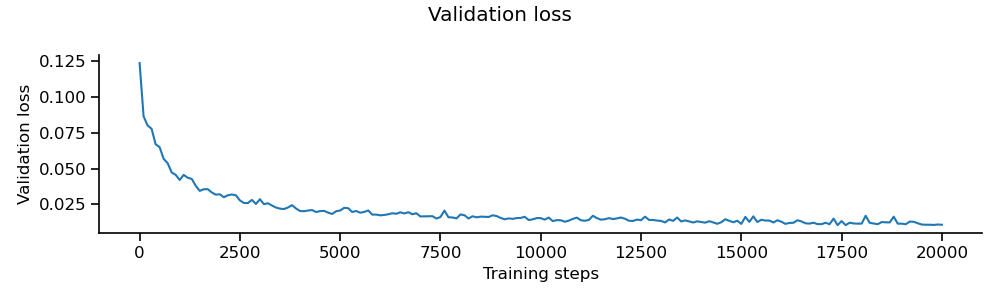

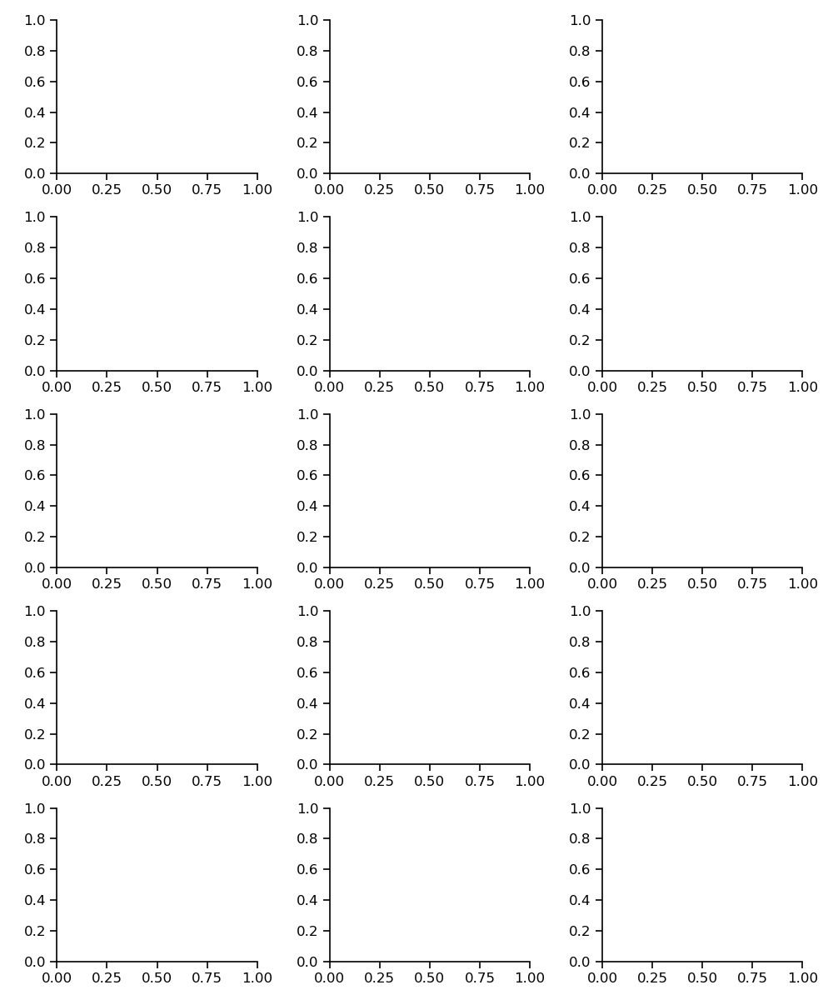

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:54<00:00, 18.41it/s]


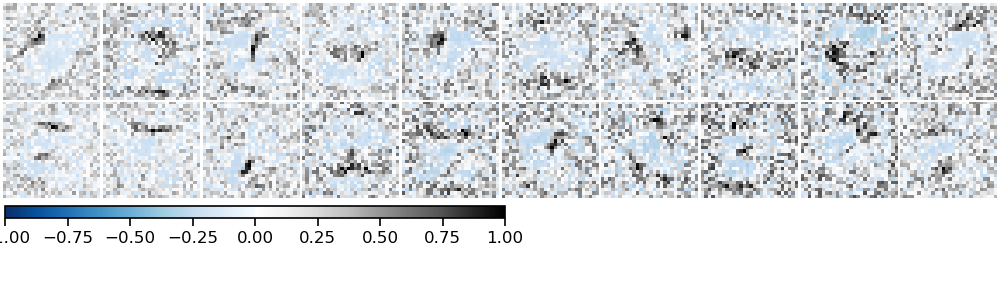

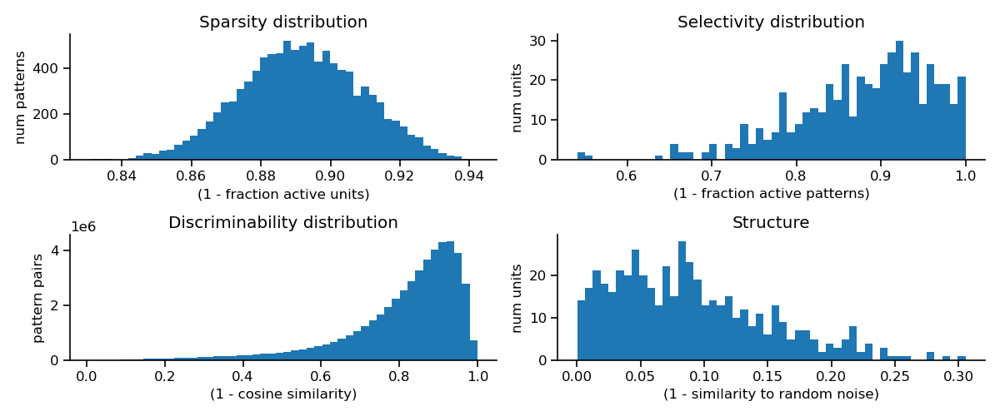

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:04<00:00, 15.60it/s]


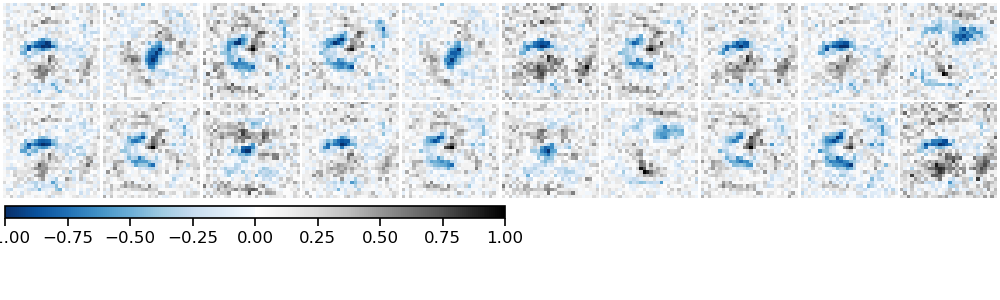

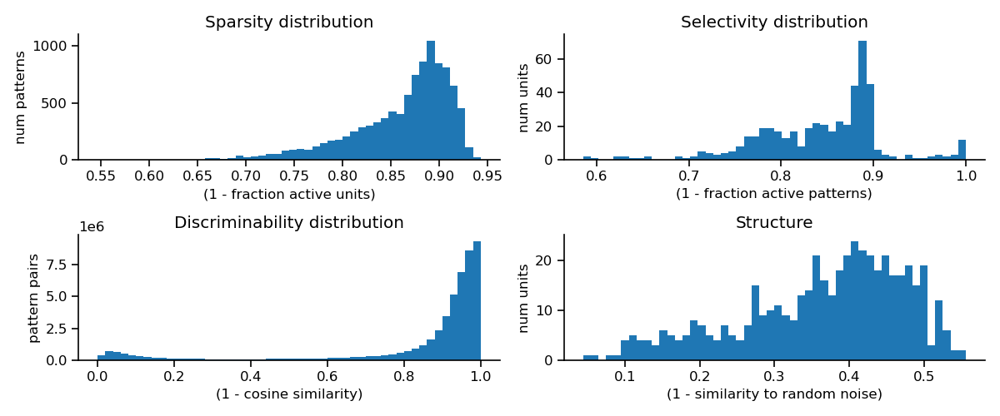

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:12<00:00, 80.07it/s]


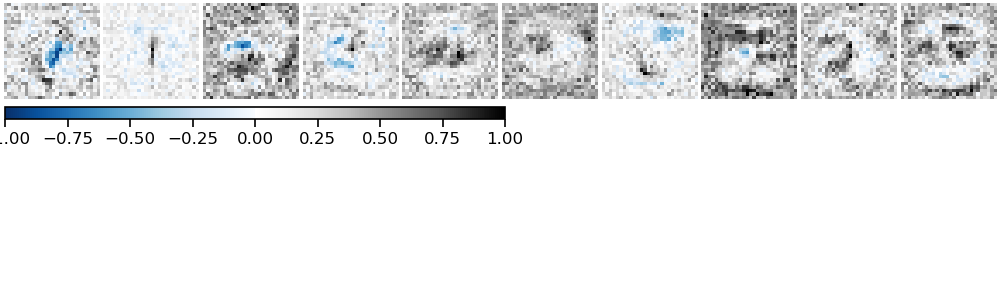

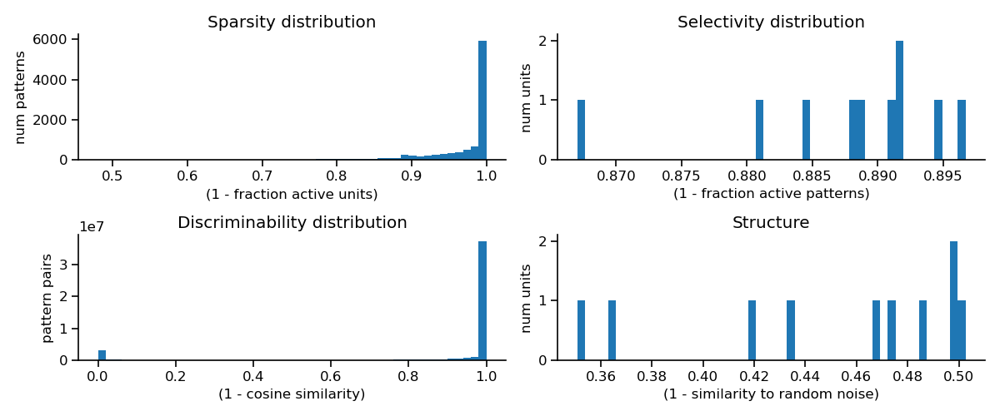

In [9]:
# Create network

config_file_path = '../data/mnist/20240419_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_F_complete_optimized.yaml'
data_file_path = '../data/mnist/20240419_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_F_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

bp_dale_network_F = network

## bpDale_relu_G

Loading network from '../data/mnist/20231129_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_G_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20231129_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_G_66049_257_complete.pkl'
Batch accuracy = 95.36000061035156%


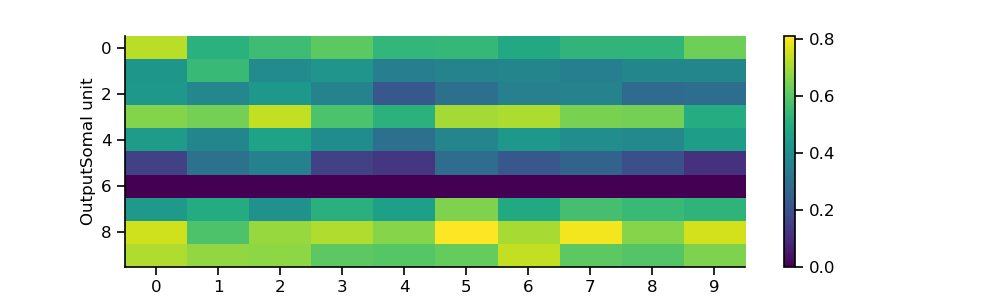

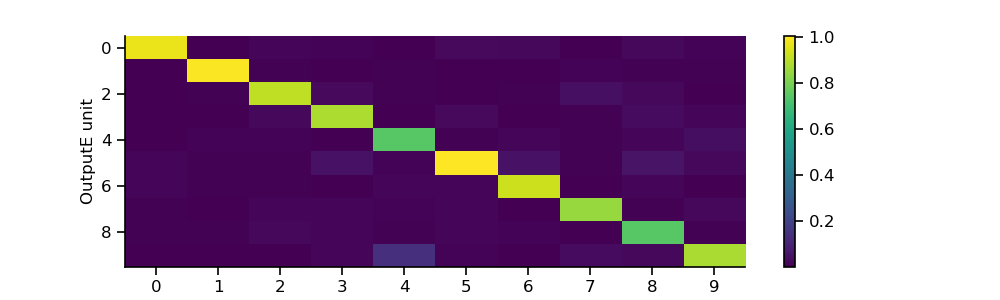

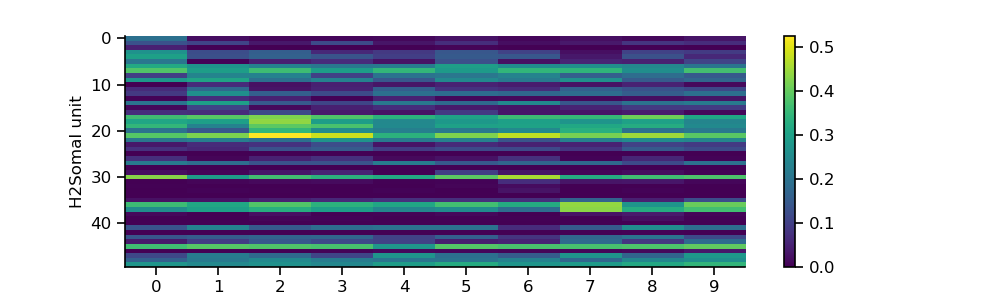

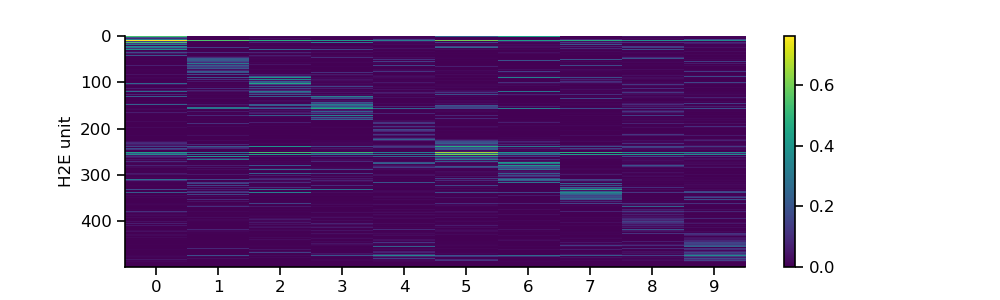

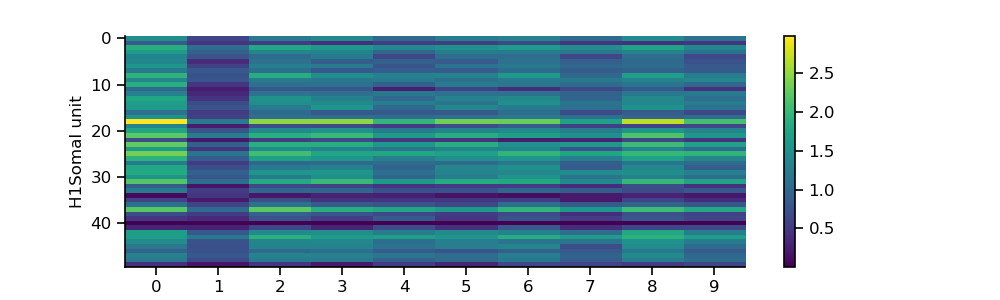

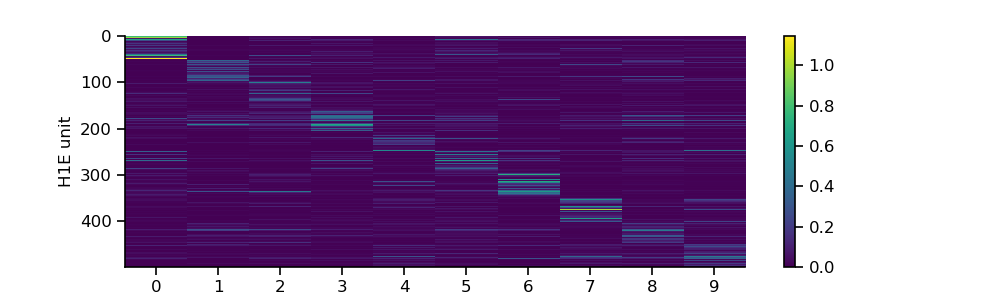

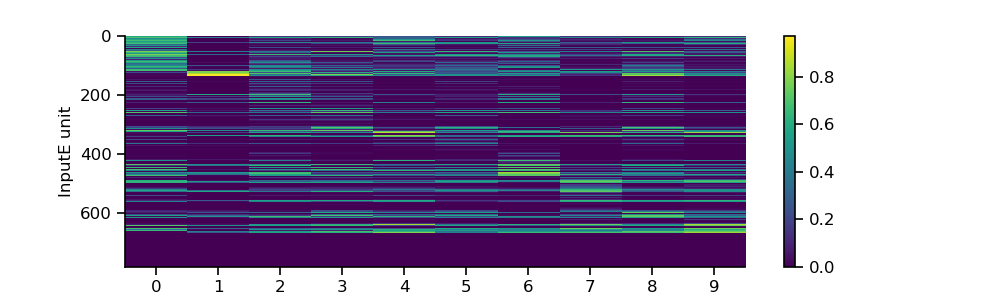

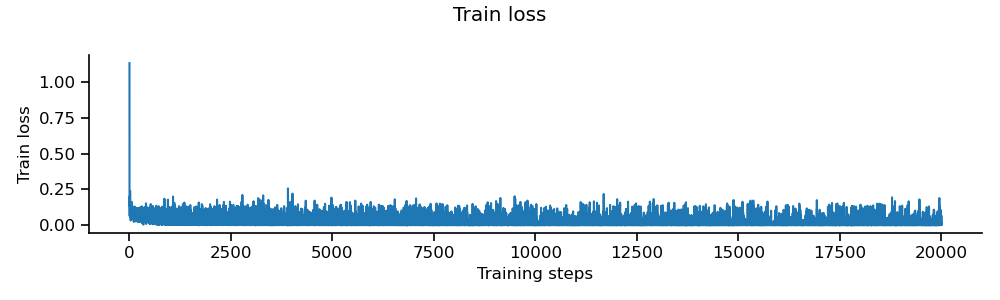

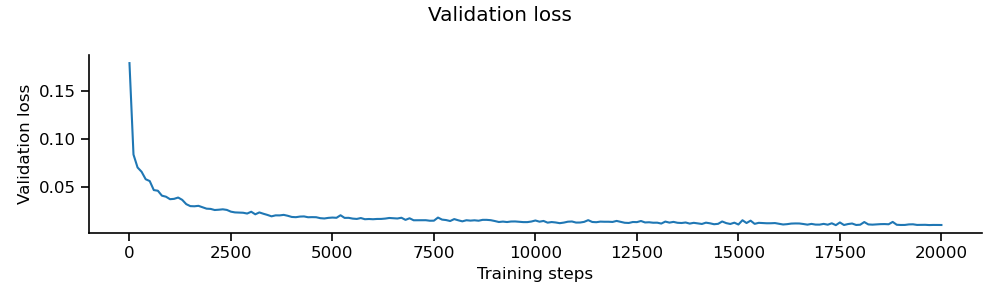

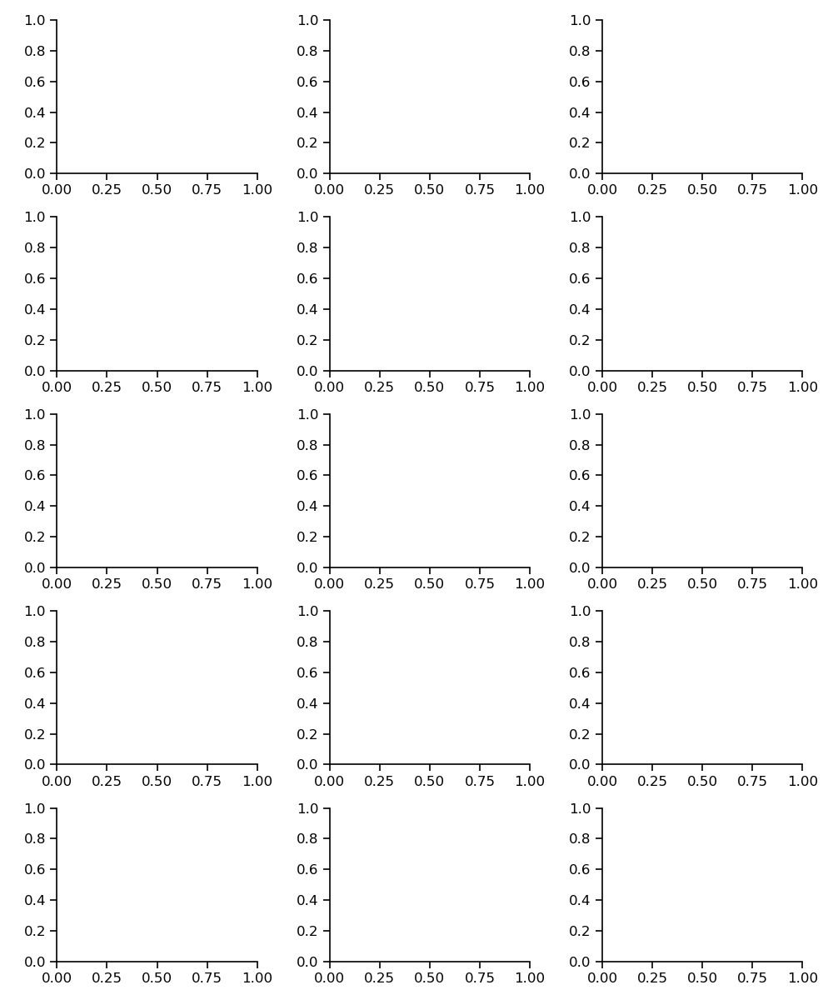

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:52<00:00, 19.06it/s]


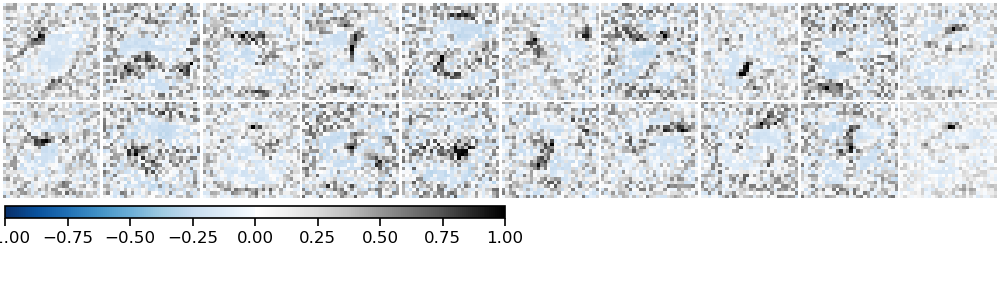

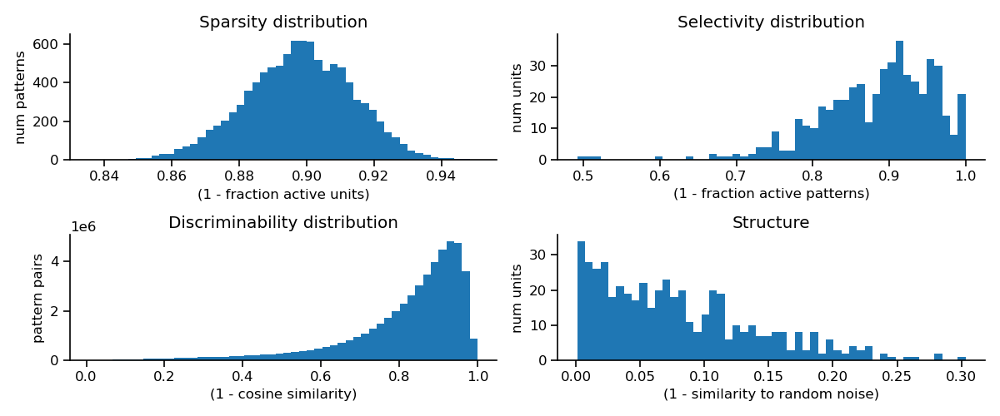

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:03<00:00, 15.63it/s]


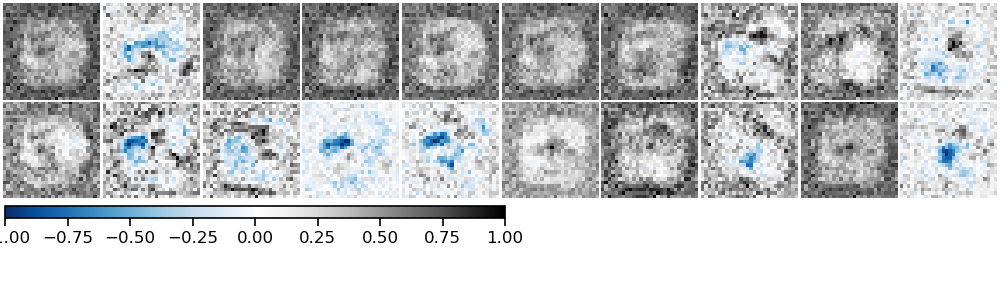

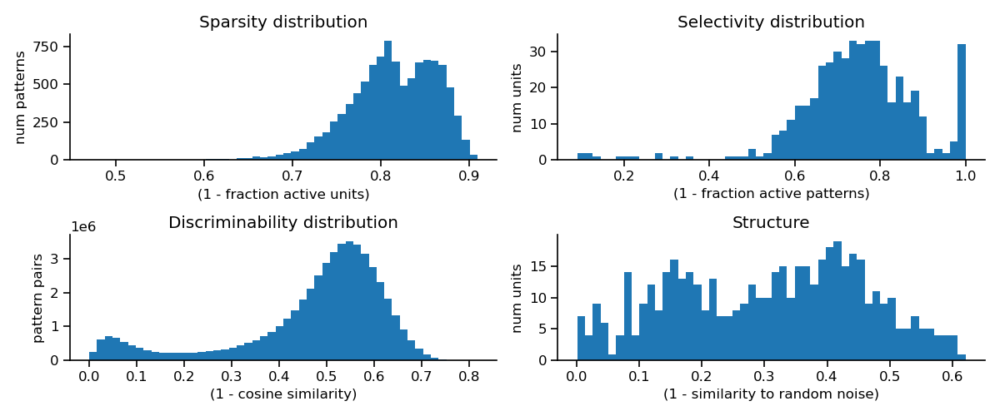

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:12<00:00, 81.82it/s]


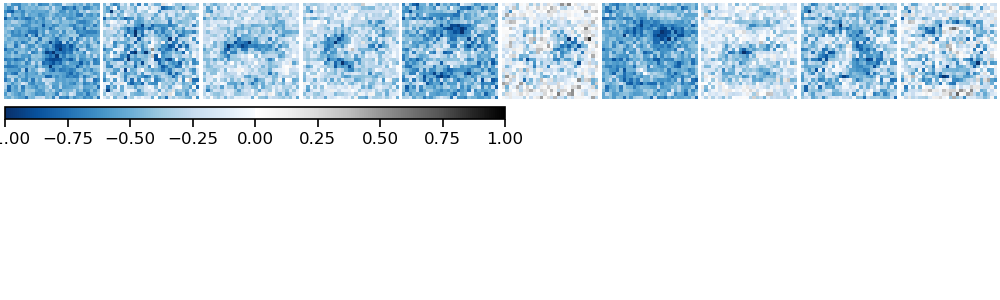

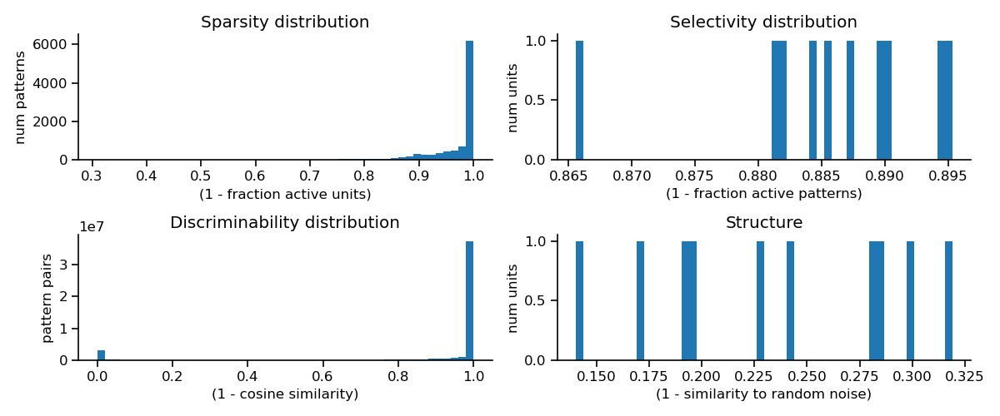

In [10]:
# Create network

config_file_path = '../network_config/mnist/20231129_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_G_optimized.yaml'
data_file_path = '../data/mnist/20231129_EIANN_2_hidden_mnist_bpDale_relu_SGD_config_G_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

bp_dale_network_G = network

## Dale_BP_like_1J (dend_temporal_contrast) (no backward lateral equilibration)

In [9]:
# Create network

config_file_path = '../network_config/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_1J_optimized.yaml'
data_file_path = '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_1J_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

dale_bp_like_network_1J = network

Exception: File: ../network_config/mnist/20240806_nested_optimize_EIANN_2_hidden_mnist_BP_like_config_1J_learn_TD_HWN_1.yaml does not exist.

## Dale_BP_like_1J_learn_TD_HWN_1 (dend_temporal_contrast) (no backward lateral equilibration) - learn TD weights with Hebb_WeightNorm

Loading model data from '../data/mnist/20240805_EIANN_2_hidden_mnist_BP_like_config_1J_learn_TD_HWN_1_66049_257_complete.pkl'...
Loading parameters into the network...
Model successfully loaded from '../data/mnist/20240805_EIANN_2_hidden_mnist_BP_like_config_1J_learn_TD_HWN_1_66049_257_complete.pkl'
Batch accuracy = 92.69999694824219%


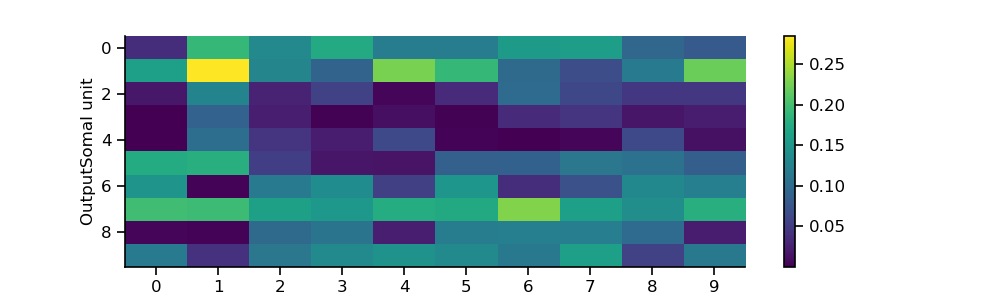

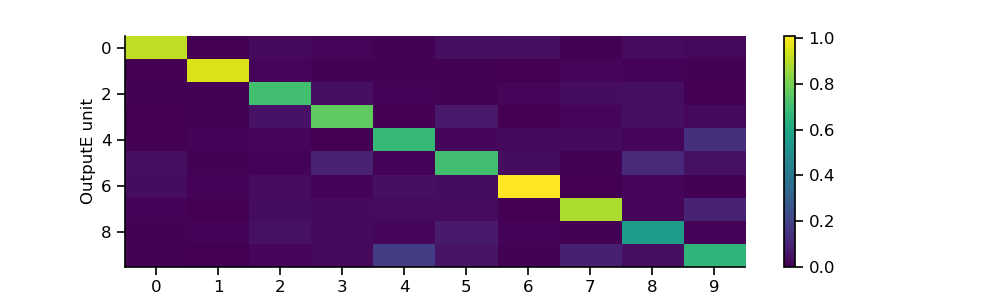

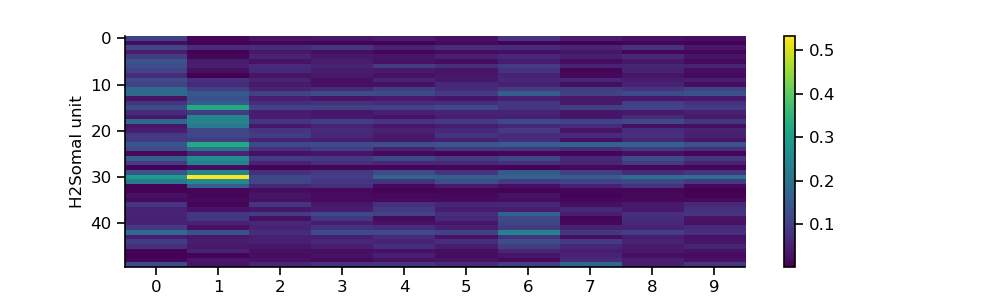

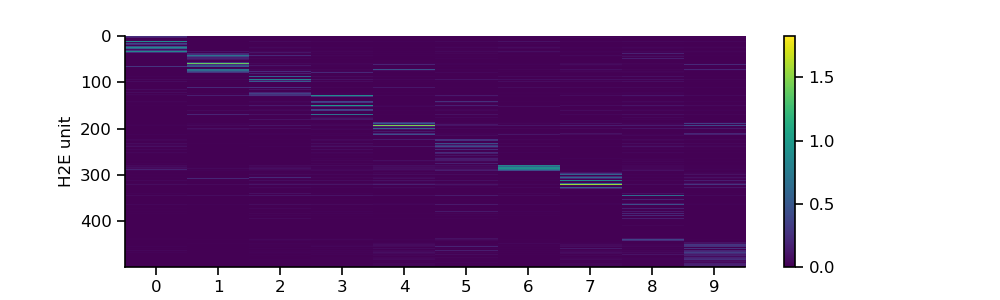

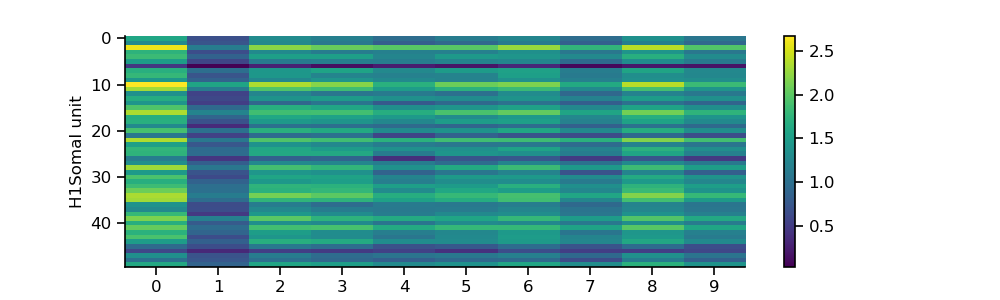

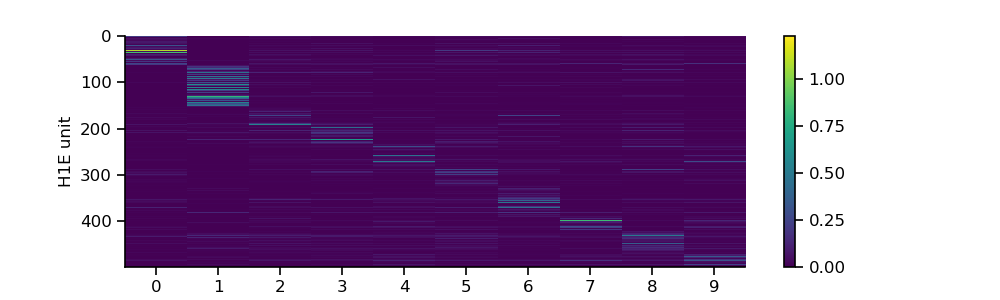

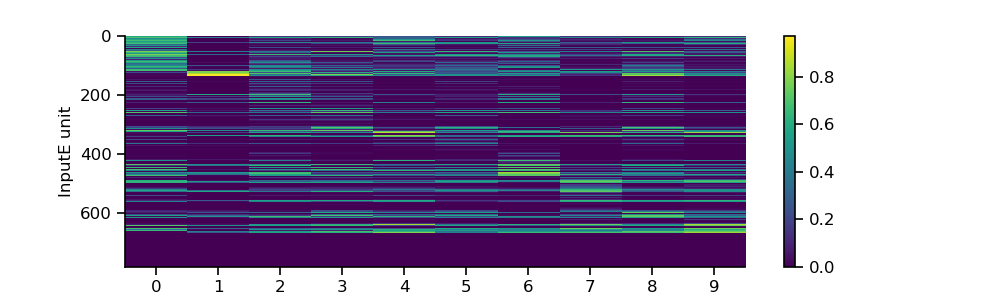

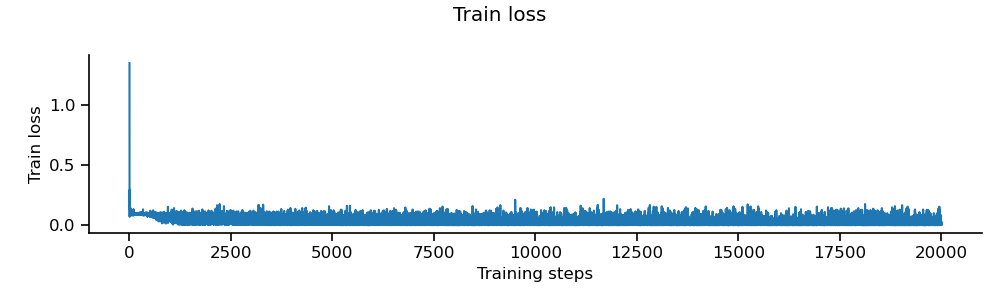

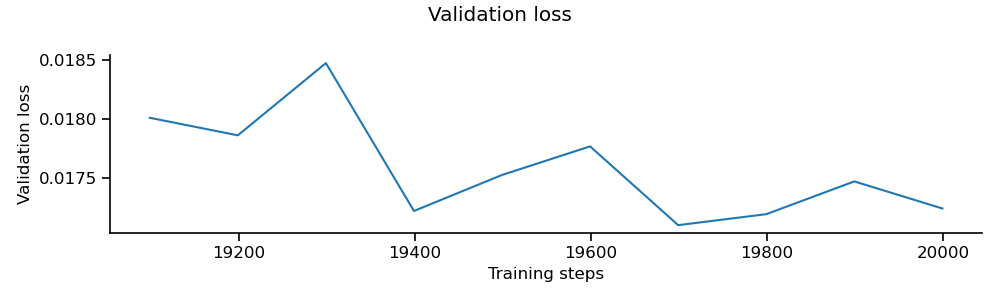

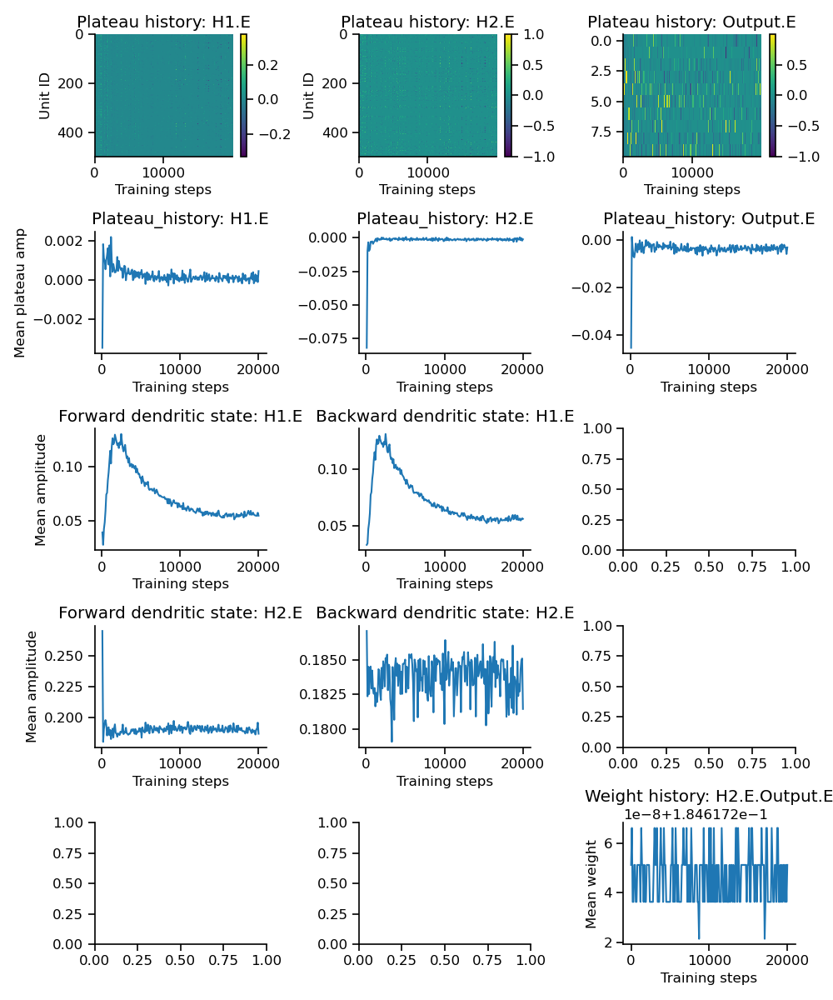

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:45<00:00, 21.82it/s]


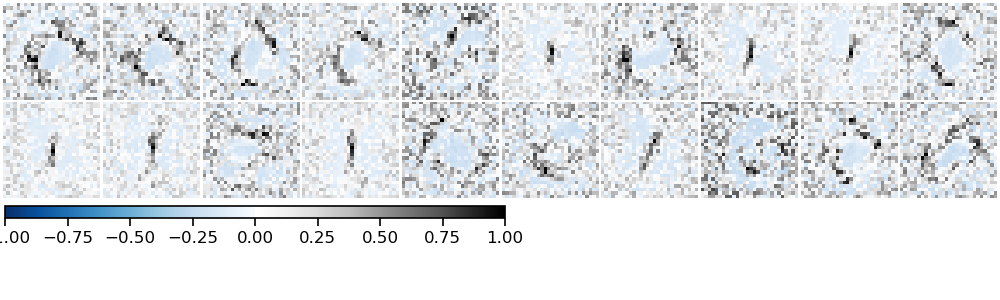

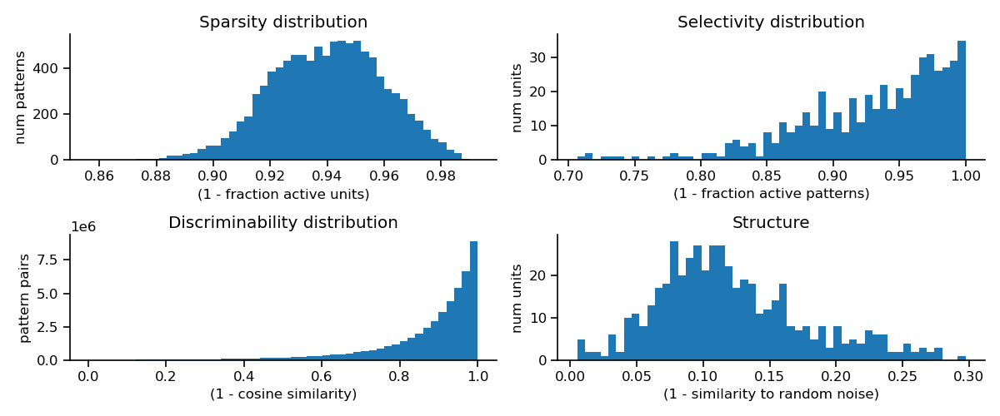

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:57<00:00, 17.31it/s]


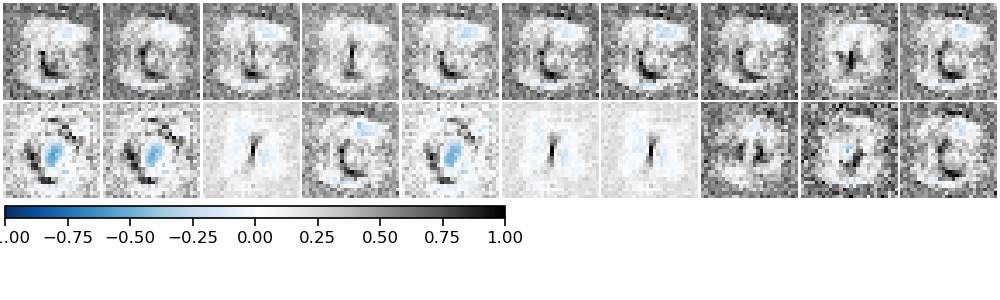

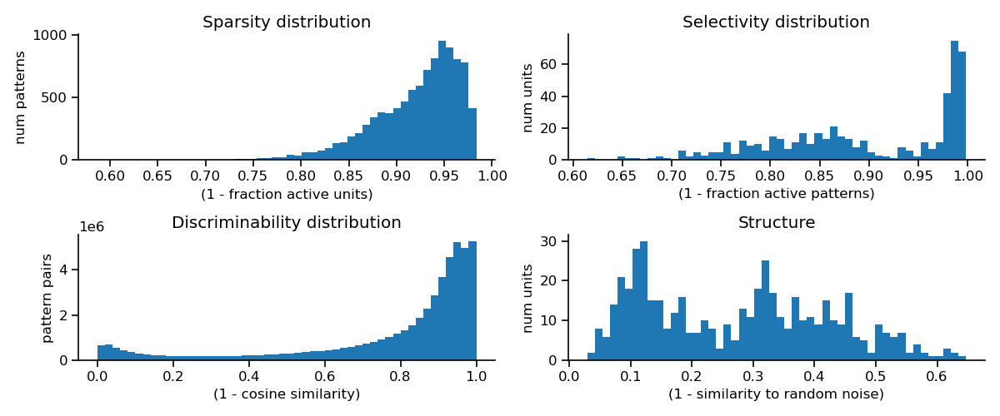

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:11<00:00, 90.75it/s]


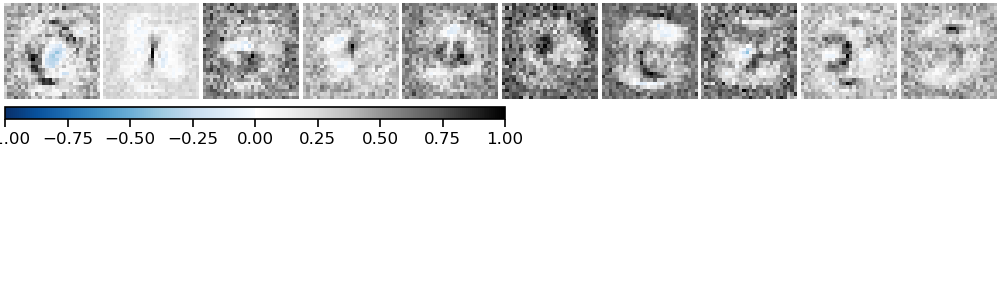

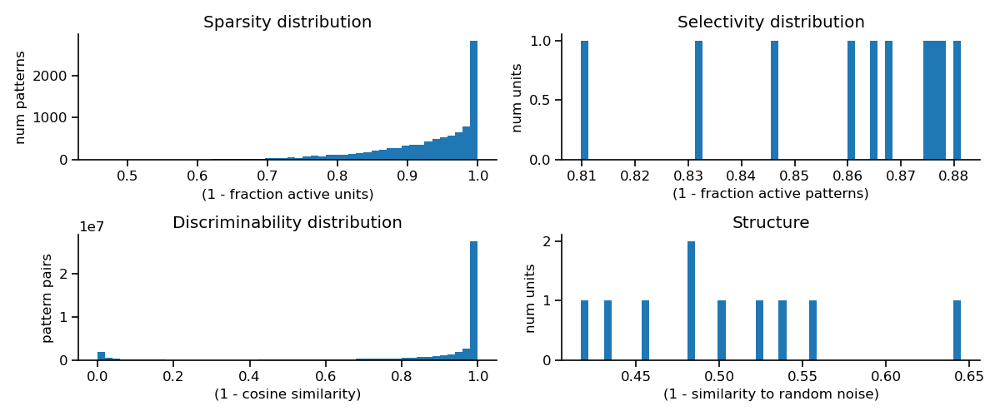

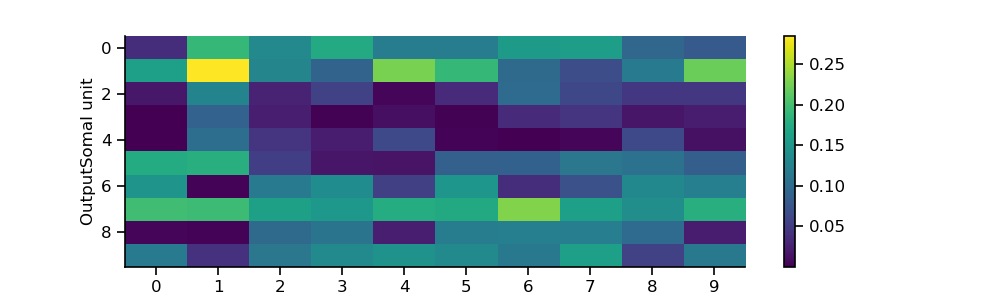

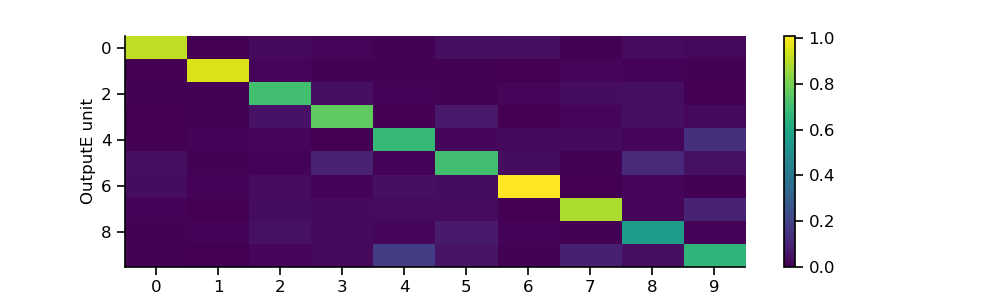

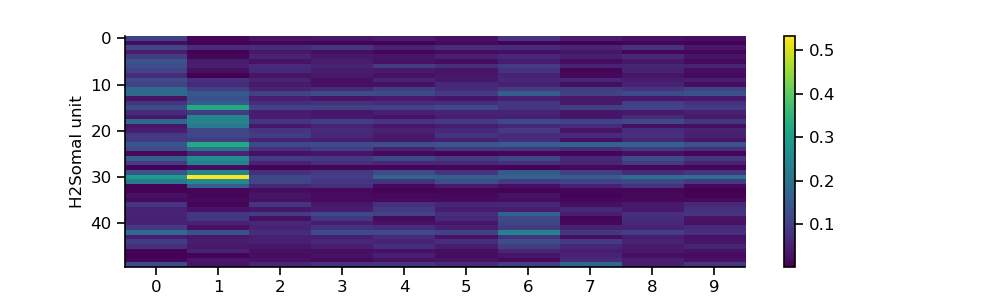

...

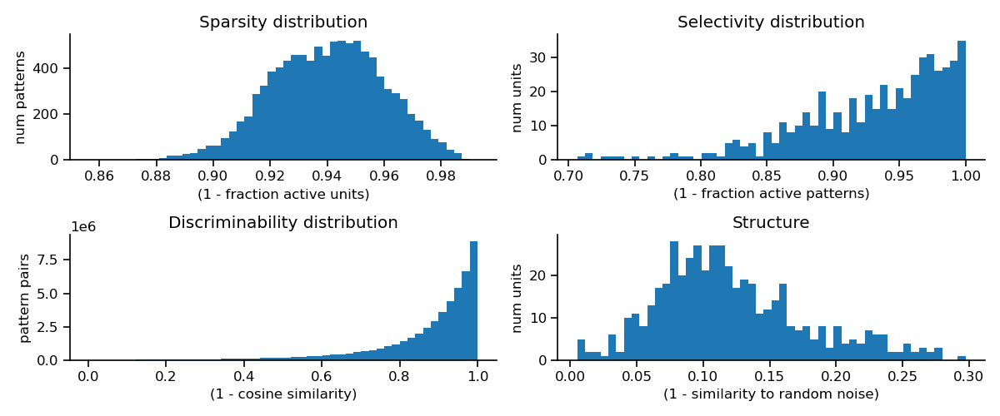

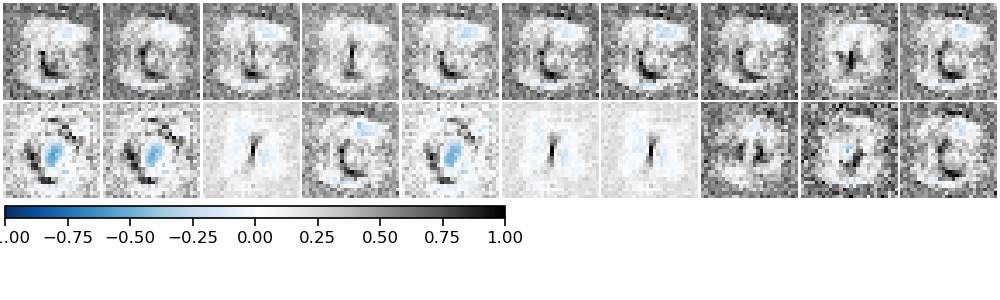

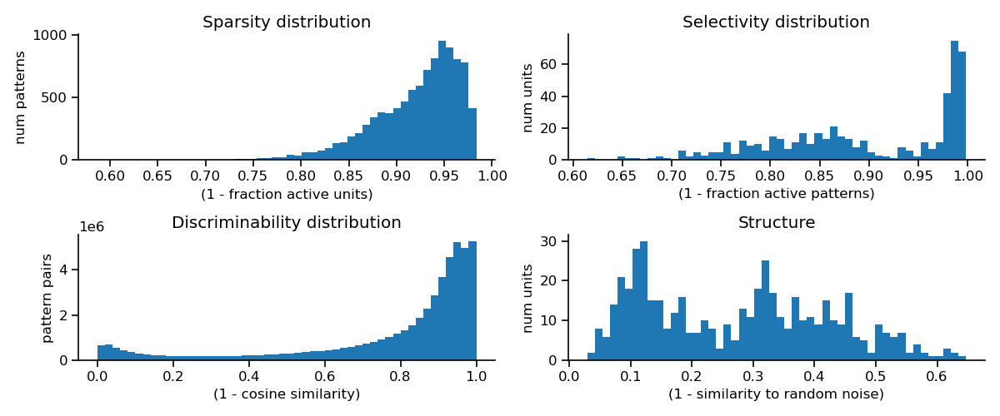

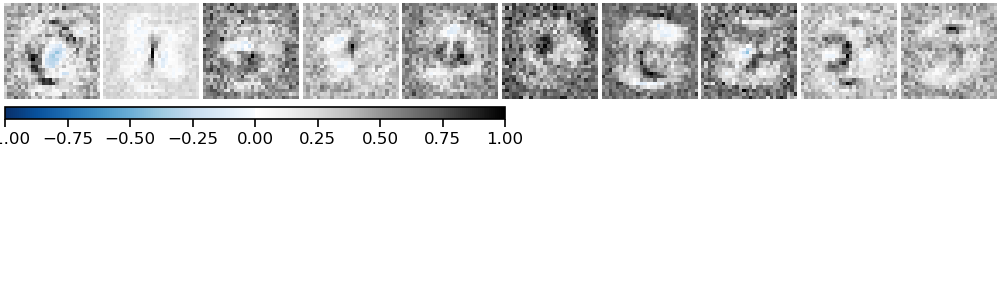

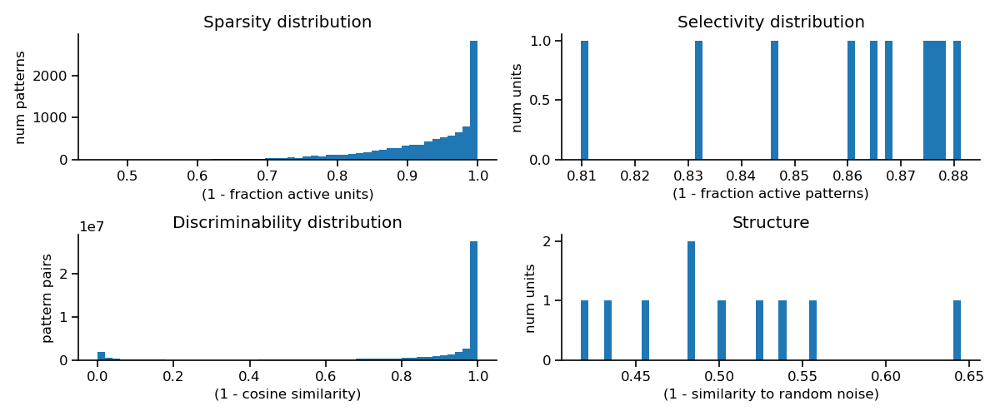

In [12]:
# Create network

config_file_path = '../data/mnist/20240805_EIANN_2_hidden_mnist_BP_like_config_1J_learn_TD_HWN_1_complete_optimized.yaml'
data_file_path = '../data/mnist/20240805_EIANN_2_hidden_mnist_BP_like_config_1J_learn_TD_HWN_1_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

dale_bp_like_network_1J_HWN_1 = network

## Dale_BP_like_1I (dend_temporal_contrast) (with backward network-wide equilibration)

In [ ]:
# Create network

config_file_path = '../network_config/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_1I_optimized.yaml'
data_file_path = '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_1I_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

dale_bp_like_network_1I = network

## Dale_BP_like_2K (dend_EI_gating) (DendI < E/I are fixed) (no backward lateral equilibration)

In [ ]:
# Create network

config_file_path = '../network_config/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_optimized.yaml'
data_file_path = '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

dale_bp_like_network_2K = network

## Dale_BP_like_2L (dend_EI_gating) (DendI < E/I are learned by Hebb_Weight_Norm) (with network-wide equilibration and auxiliary objective to reduce forward_dendritic_state)

Loading network from '../data/mnist/20240516_EIANN_2_hidden_mnist_BP_like_config_2L_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20240516_EIANN_2_hidden_mnist_BP_like_config_2L_66049_257_complete.pkl'
Batch accuracy = 92.22000122070312%


/Users/aaronmil/src/EIANN/EIANN/plot.py:747: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  avg_pop_activity = torch.tensor(avg_pop_activity)


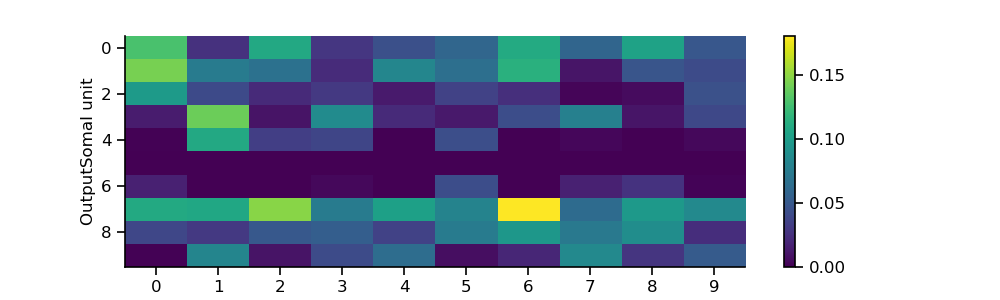

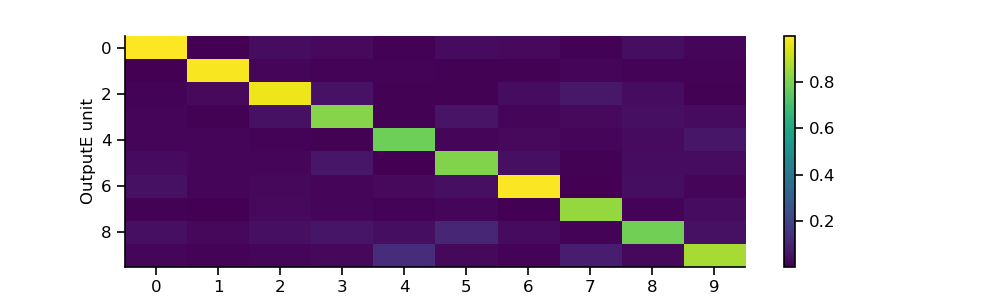

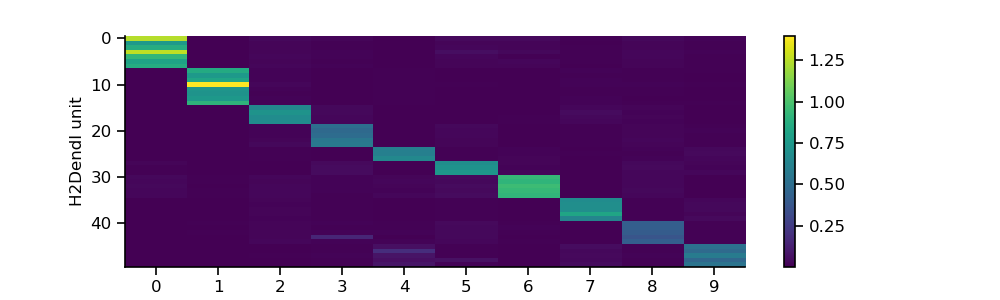

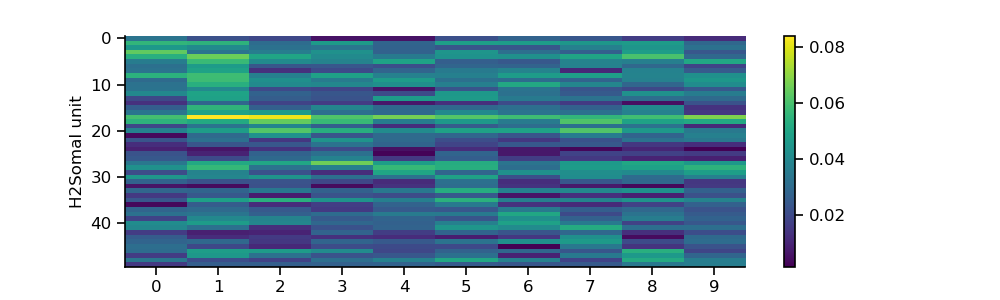

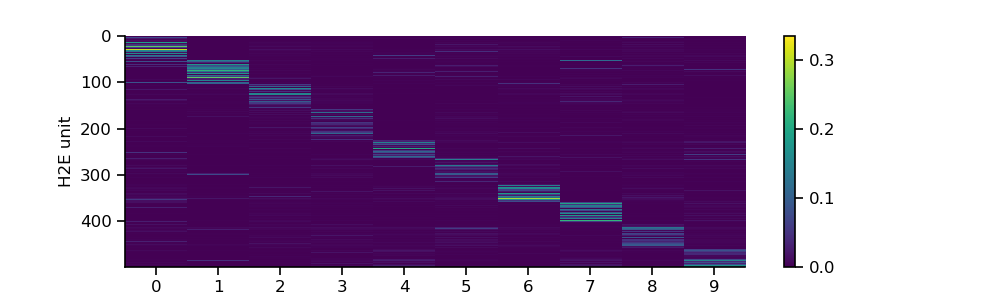

...

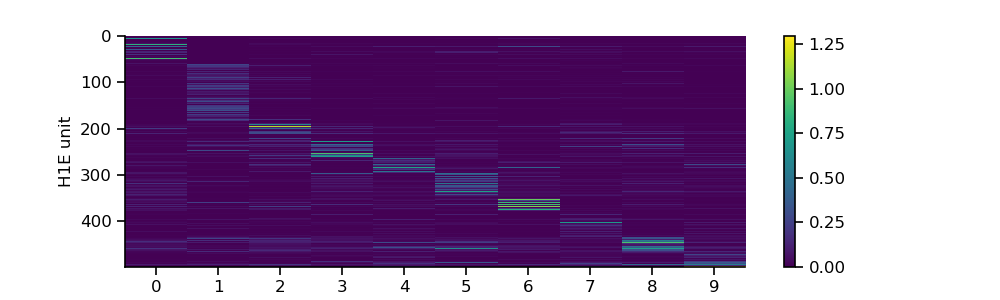

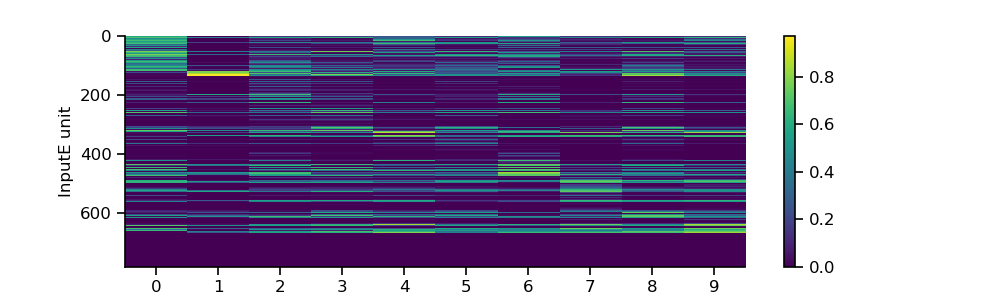

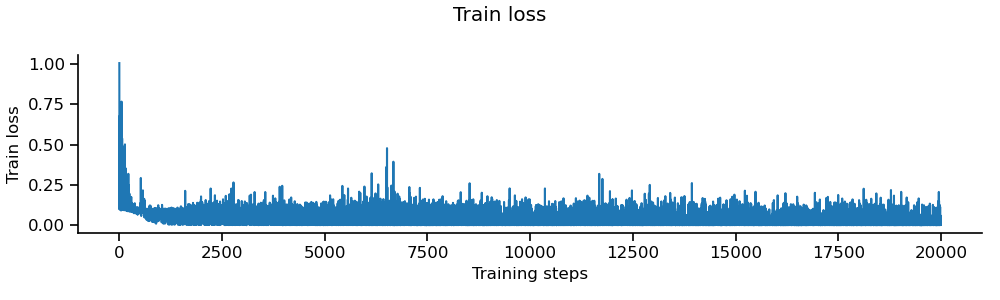

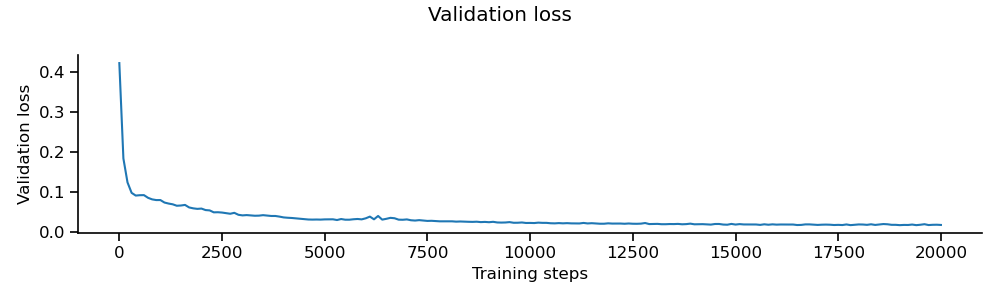

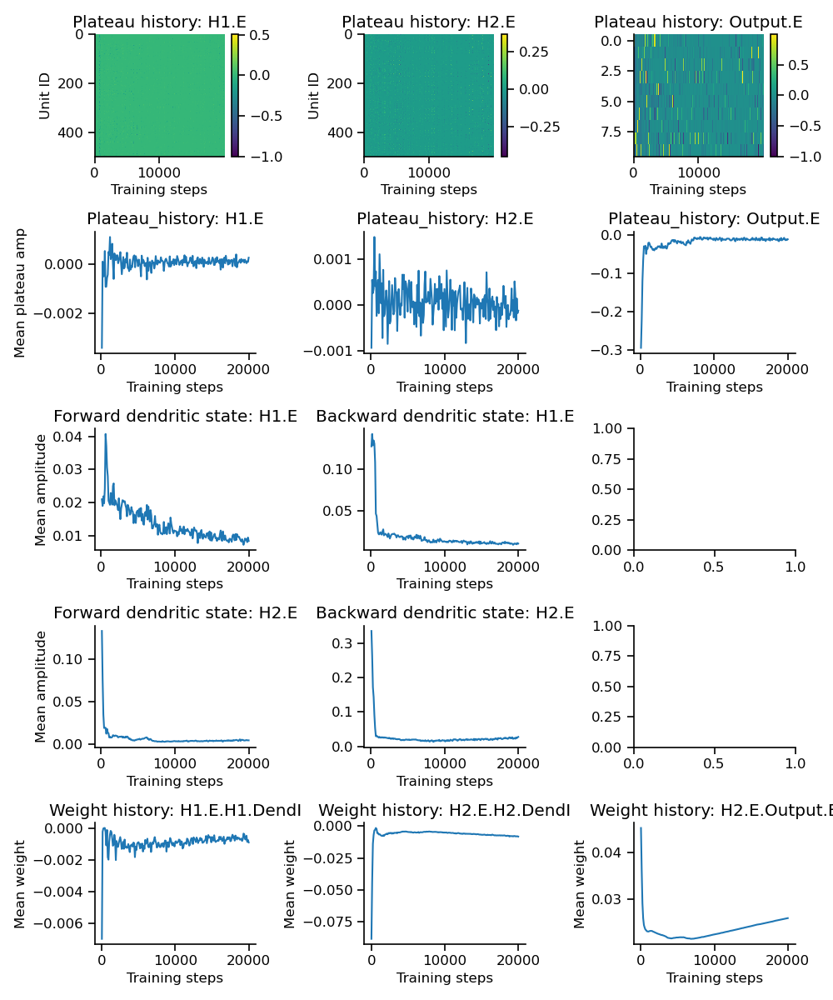

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:03<00:00, 15.72it/s]


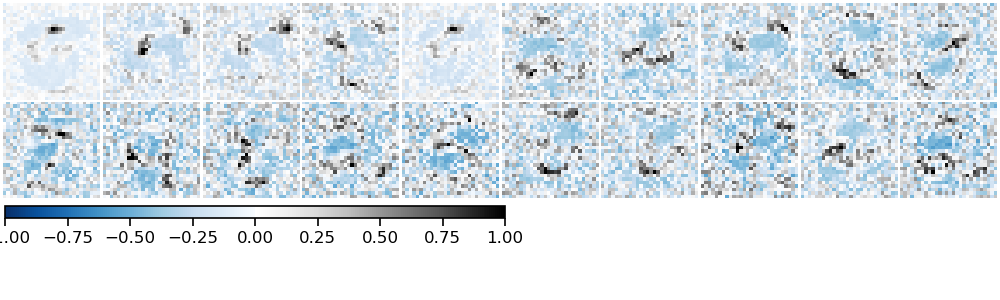

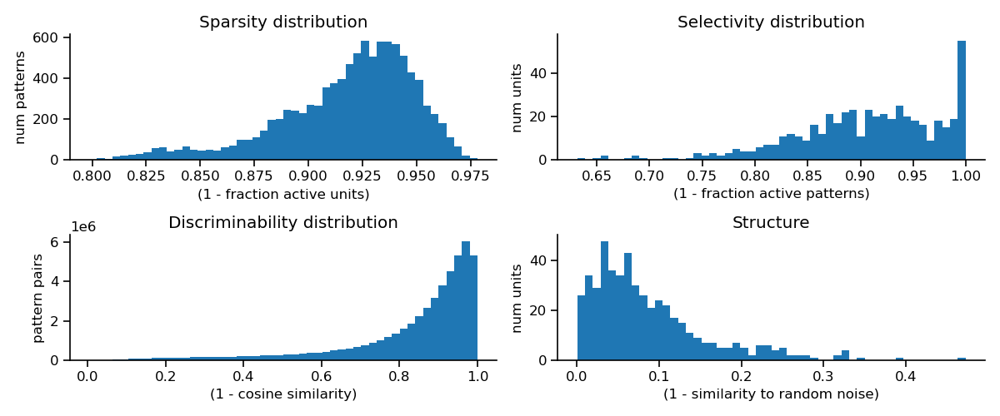

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:10<00:00, 14.19it/s]


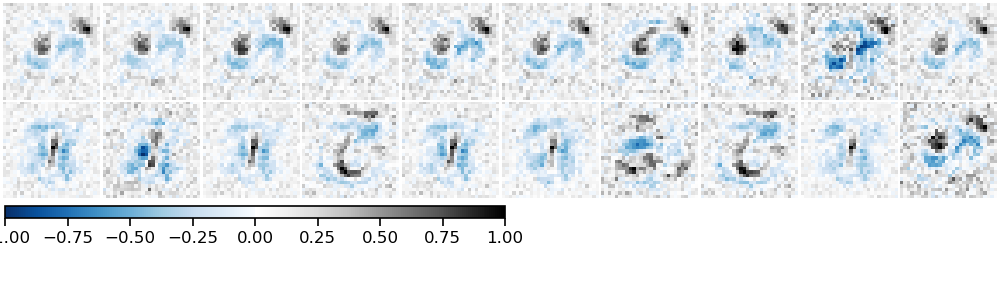

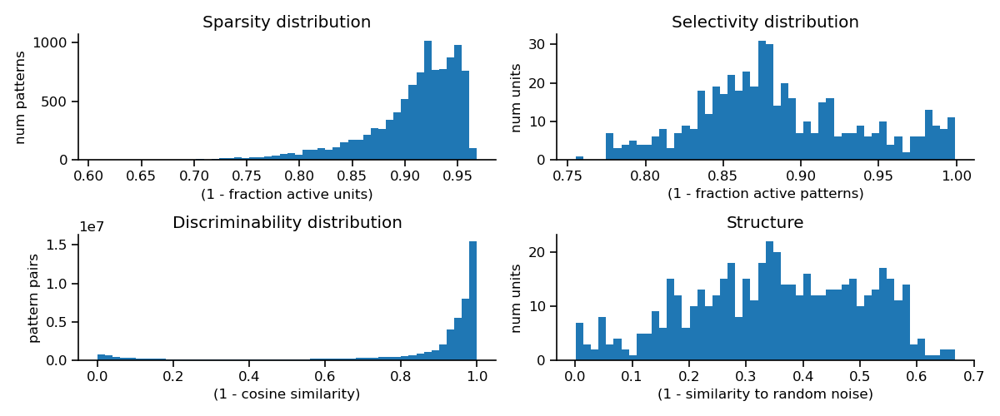

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:14<00:00, 70.74it/s]


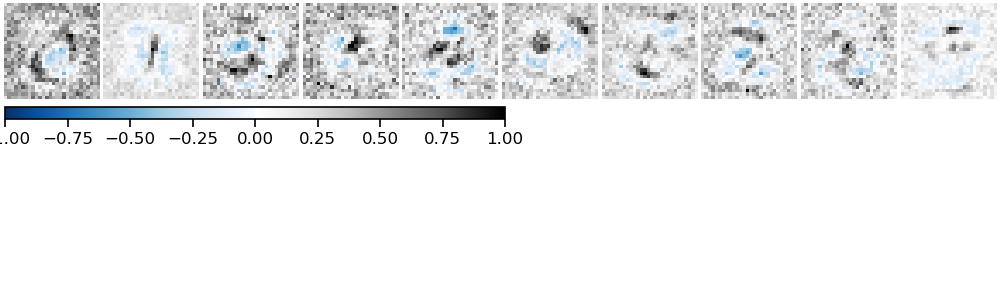

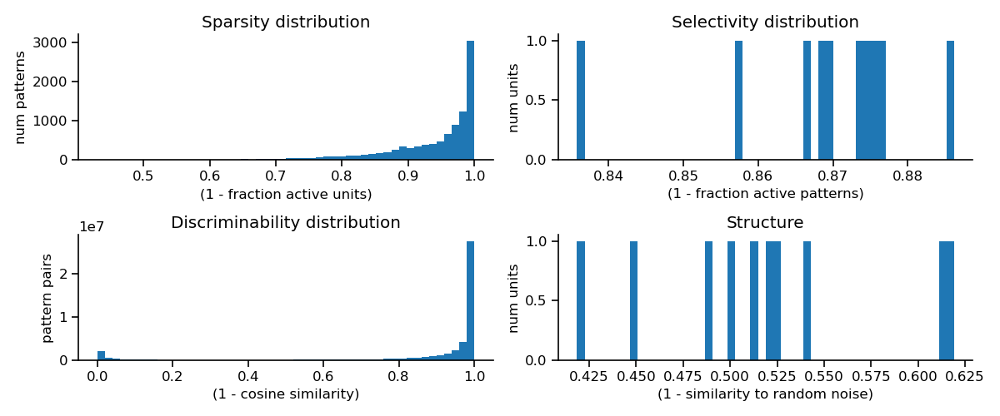

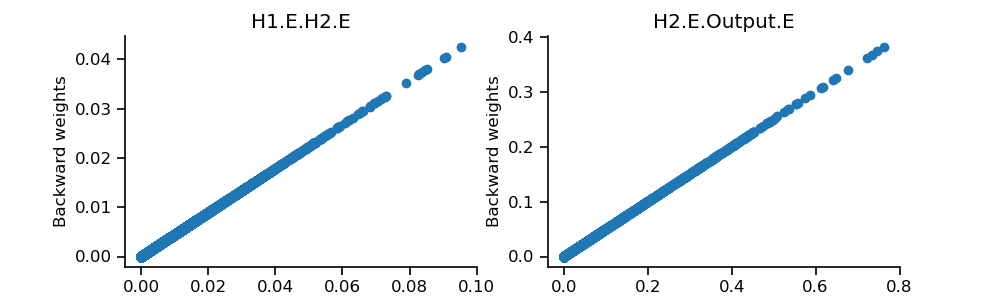

In [9]:
# Create network

config_file_path = '../network_config/mnist/20240516_EIANN_2_hidden_mnist_BP_like_config_2L_optimized.yaml'
data_file_path = '../data/mnist/20240516_EIANN_2_hidden_mnist_BP_like_config_2L_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

dale_bp_like_network_2L = network

## BP_like_2L_fixed_TD

Loading network from '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_fixed_TD_66049_257_test.pkl'
Network successfully loaded from '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_fixed_TD_66049_257_test.pkl'
Batch accuracy = 90.6500015258789%


/Users/aaronmil/src/EIANN/EIANN/plot.py:747: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  avg_pop_activity = torch.tensor(avg_pop_activity)


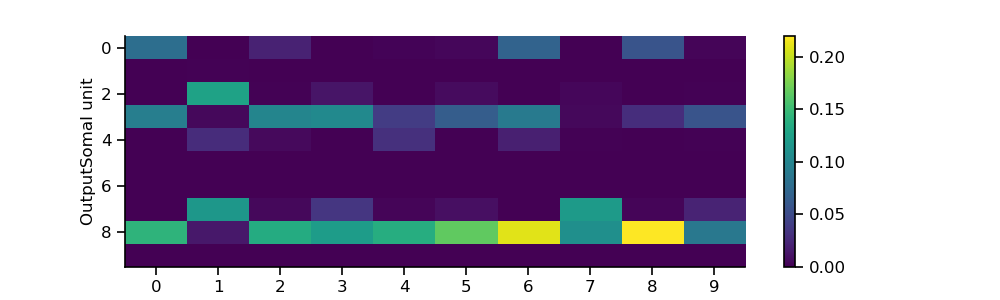

/Users/aaronmil/src/EIANN/EIANN/plot.py:760: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, _ax = plt.subplots()


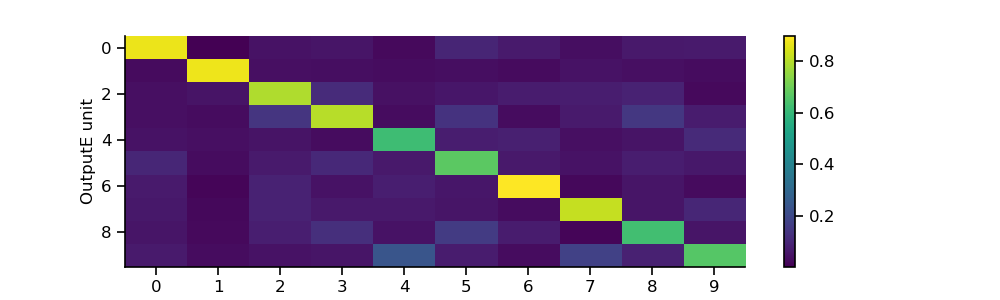

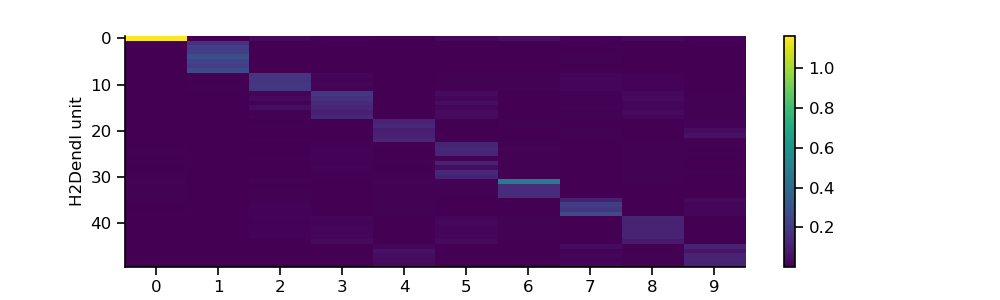

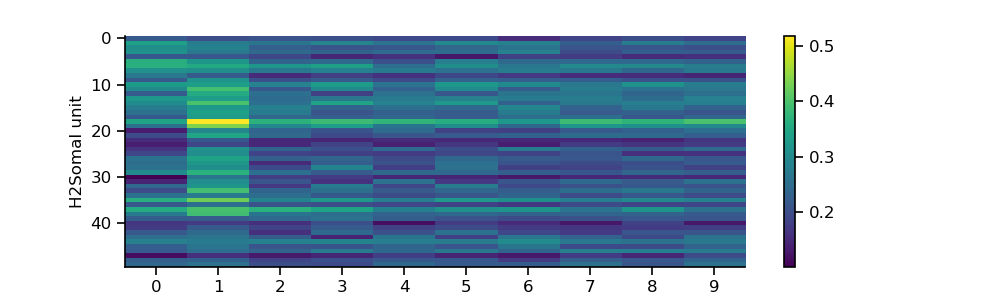

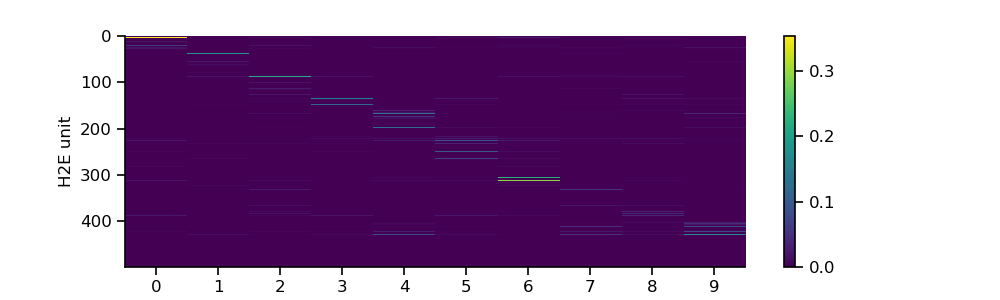

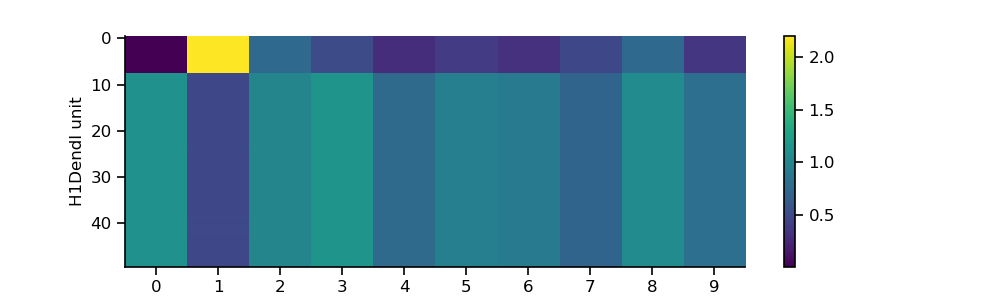

...

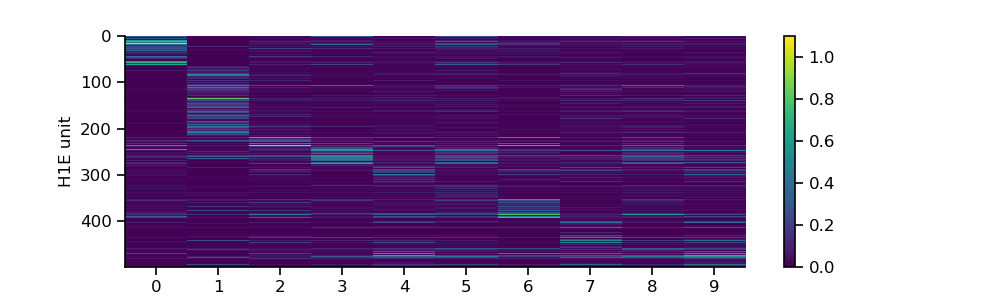

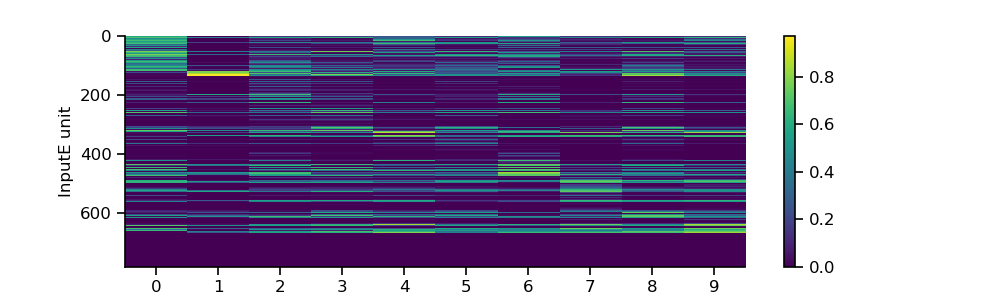

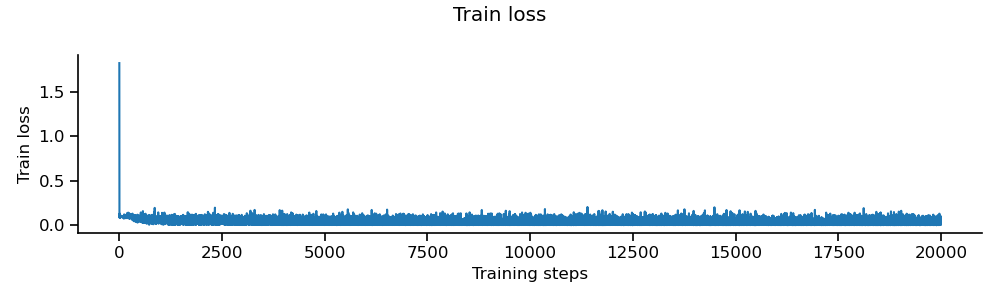

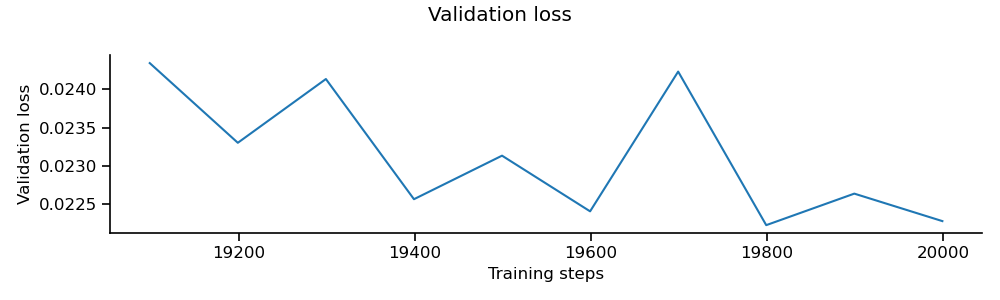

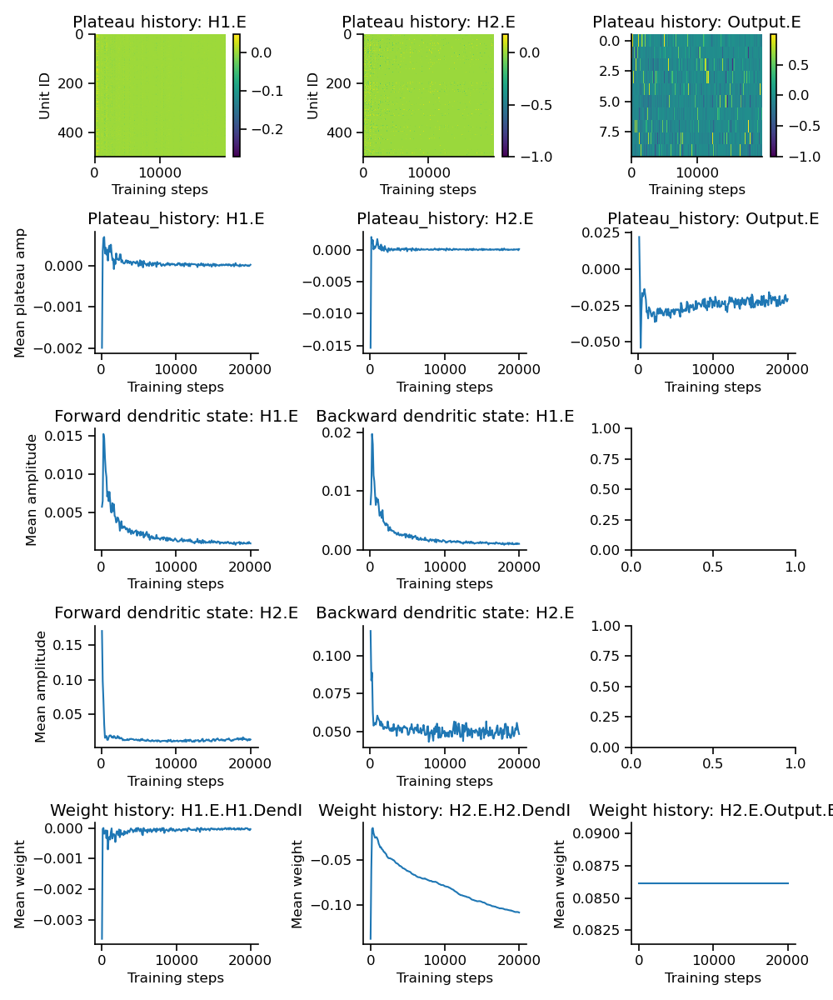

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:11<00:00, 13.92it/s]


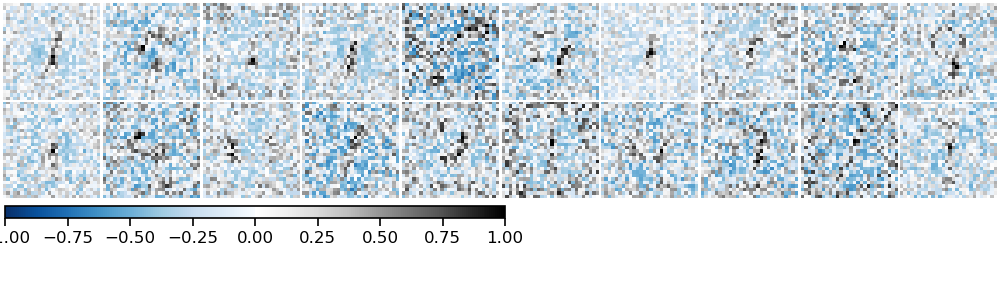

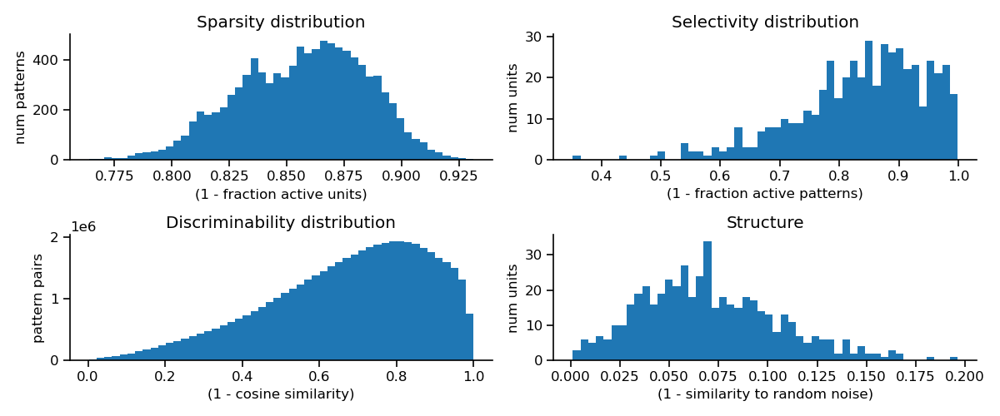

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:50<00:00,  9.02it/s]


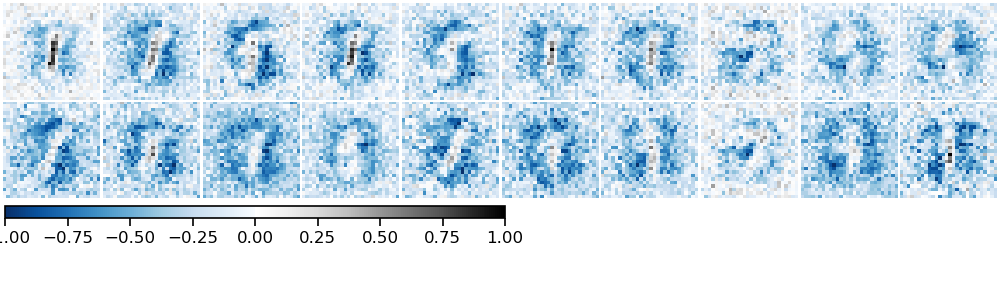

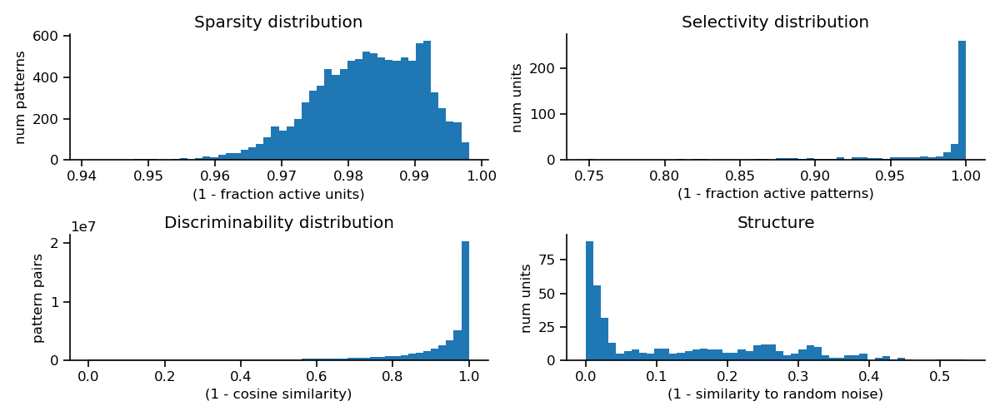

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:19<00:00, 51.12it/s]


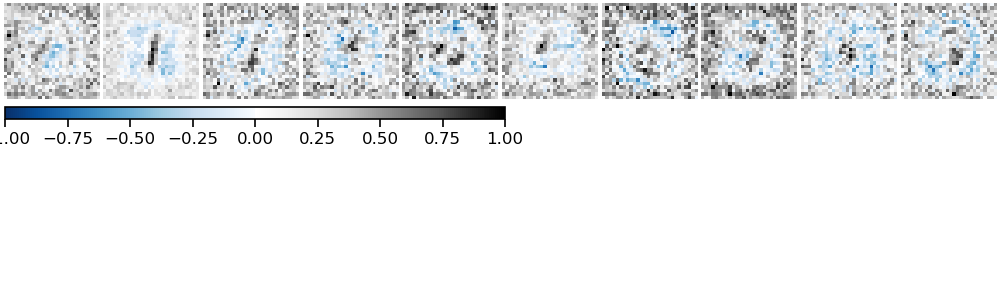

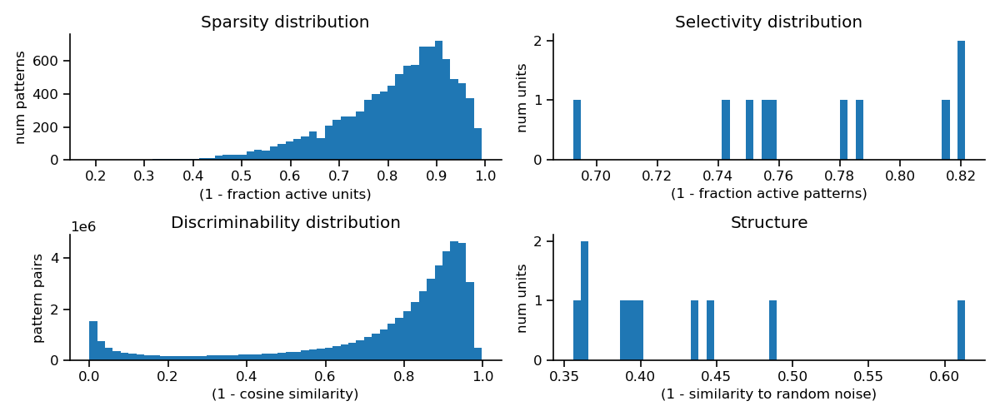

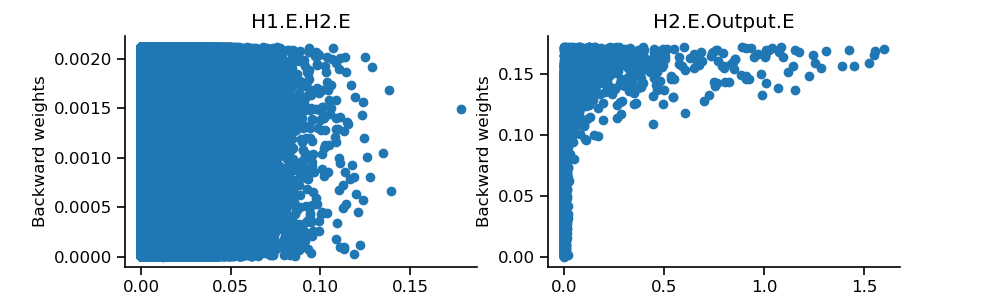

In [10]:
# Create network

config_file_path = '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_fixed_TD_test_optimized.yaml'
data_file_path = '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_fixed_TD_66049_257_test.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000,
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

BP_like_network_2L_fixed_TD = network

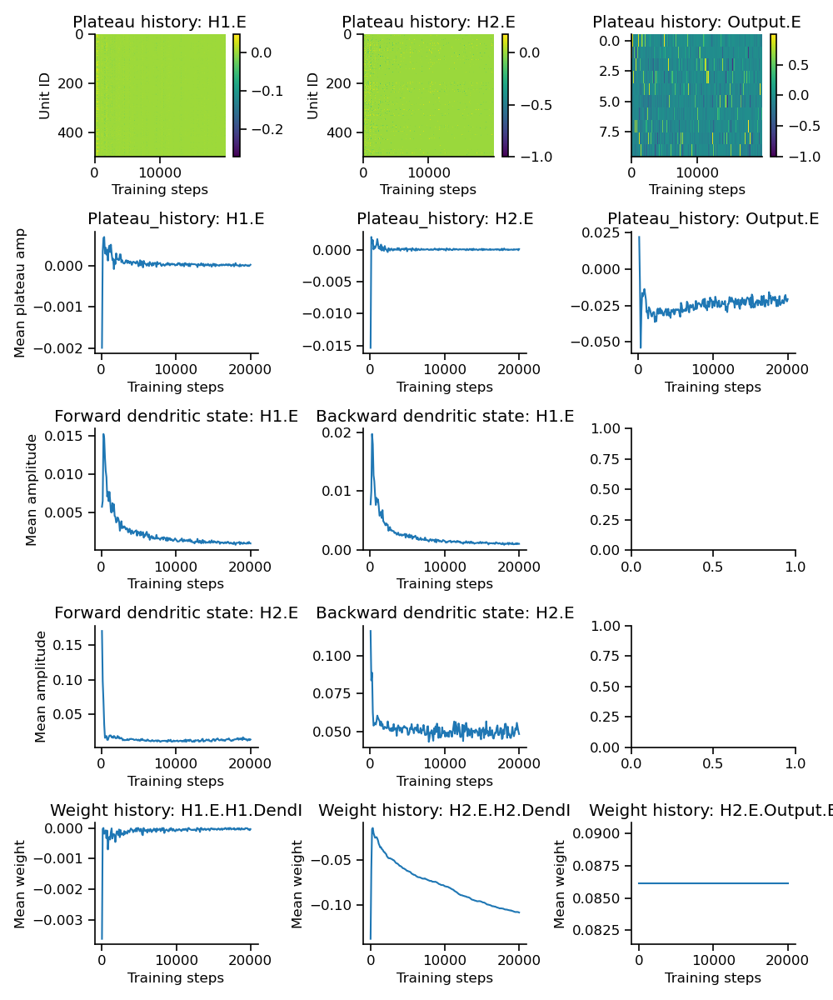

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:00<00:00,  8.32it/s]


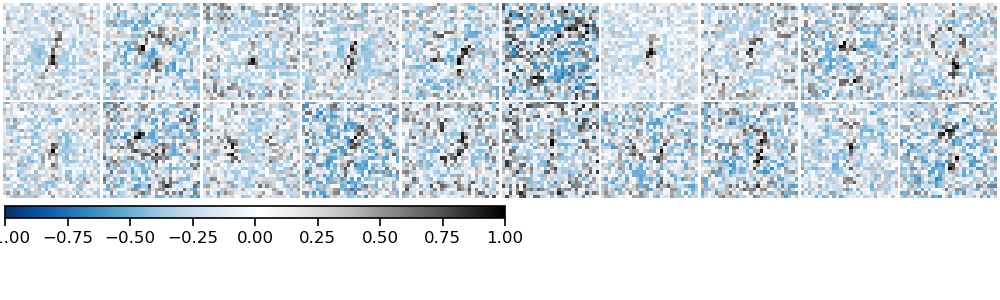

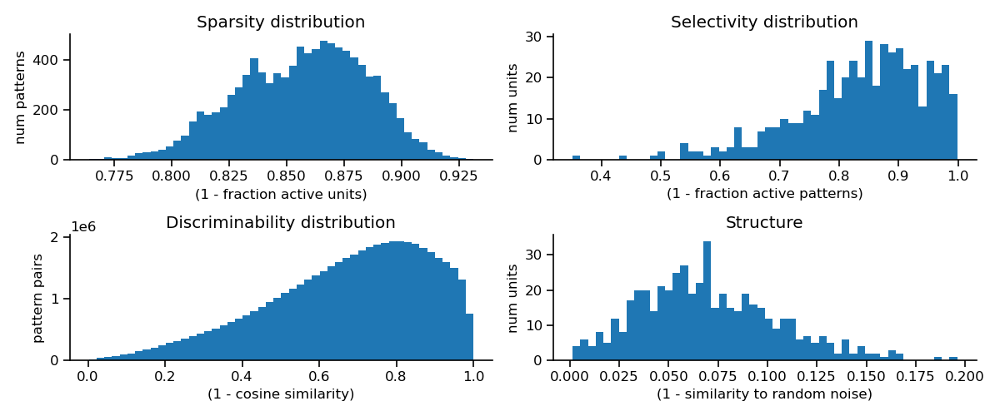

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:07<00:00,  7.82it/s]


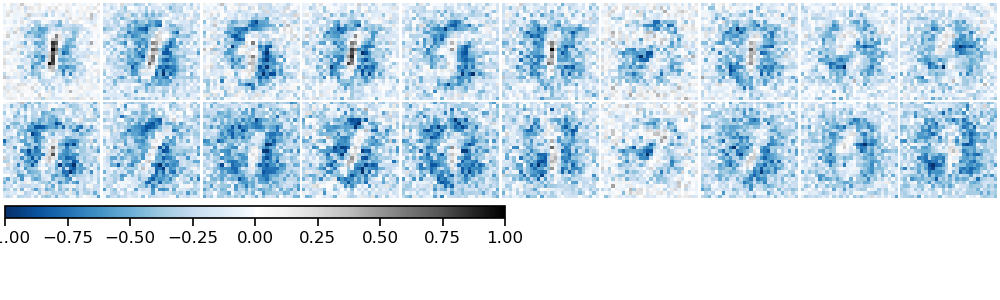

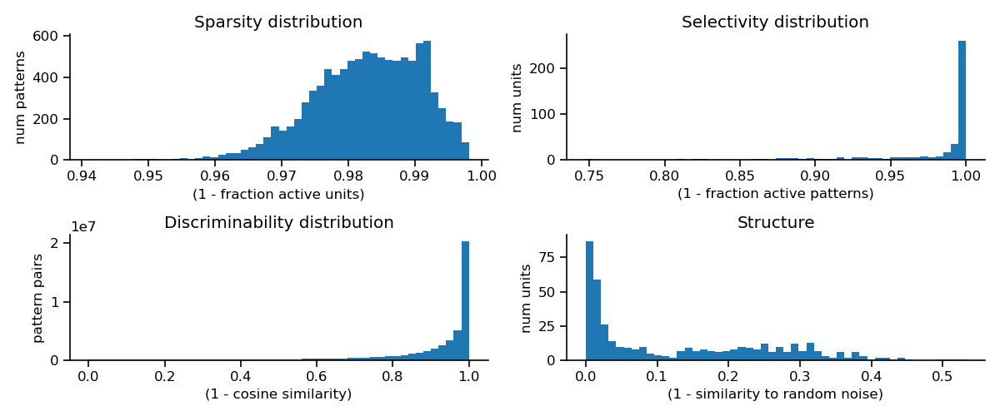

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:23<00:00, 42.48it/s]


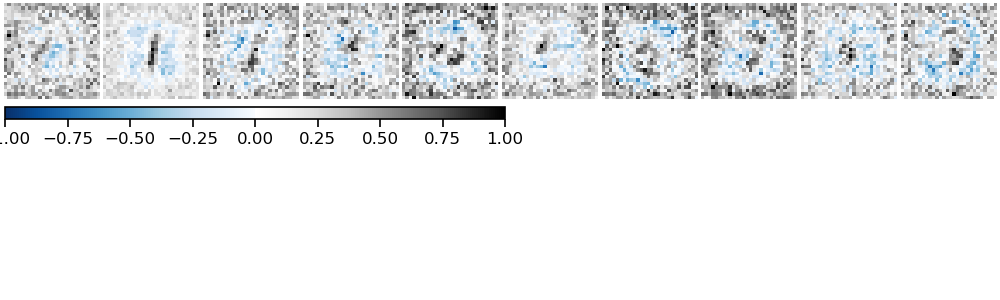

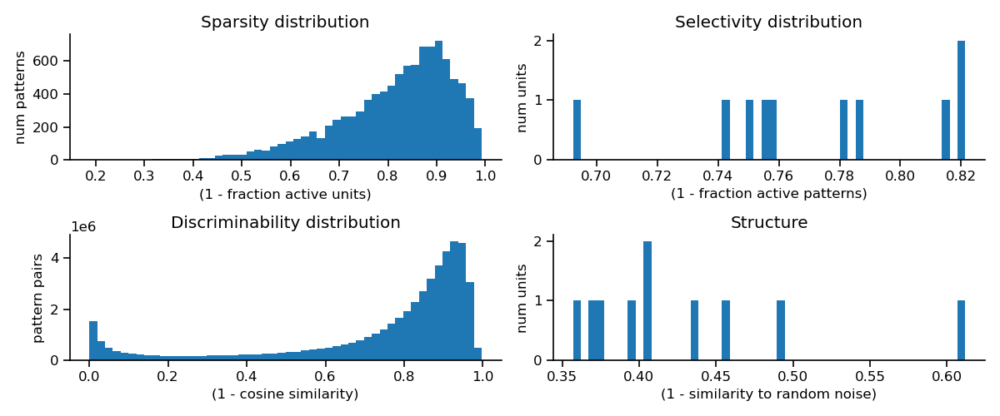

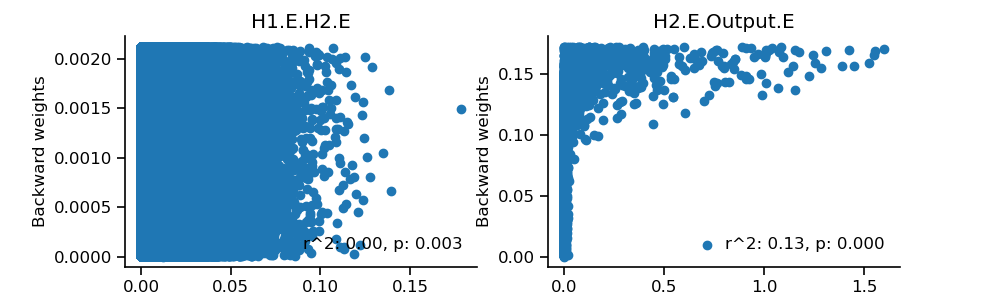

In [12]:
plot_mnist_network_intermediates(network)

## Dale_BP_like_2L_learn_TD_HWN_1 (dend_EI_gating) (DendI < E/I are learned by Hebb_WeightNorm) (with network-wide equilibration and auxiliary objective to reduce forward_dendritic_state) (top-down weights are learned by Hebb_WeightNorm)

In [ ]:
# Create network

config_file_path = '../data/mnist/20240812_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_1_complete_optimized.yaml'
data_file_path = '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

BP_like_network_2L_learn_TD_HWN_1 = network

## Dale_BP_like_2L_learn_TD_HWN_2 (dend_EI_gating) (DendI < E/I are learned by Hebb_WeightNorm) (with network-wide equilibration and auxiliary objective to reduce forward_dendritic_state) (top-down weights are learned by Hebb_WeightNorm)

Loading network from '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_2_66049_257_test.pkl'
Network successfully loaded from '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_2_66049_257_test.pkl'
Batch accuracy = 92.62999725341797%


/Users/aaronmil/src/EIANN/EIANN/plot.py:747: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  avg_pop_activity = torch.tensor(avg_pop_activity)


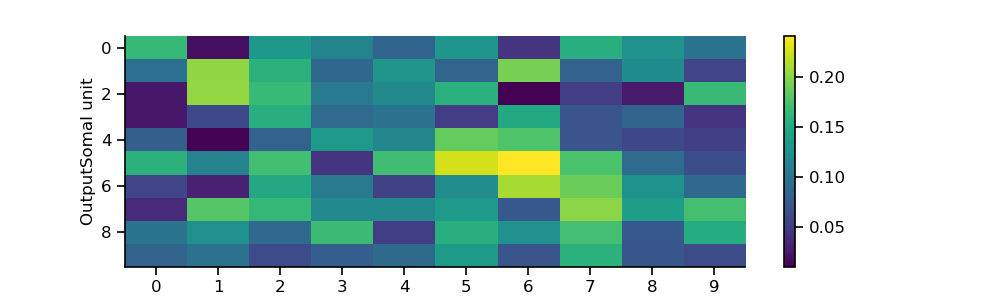

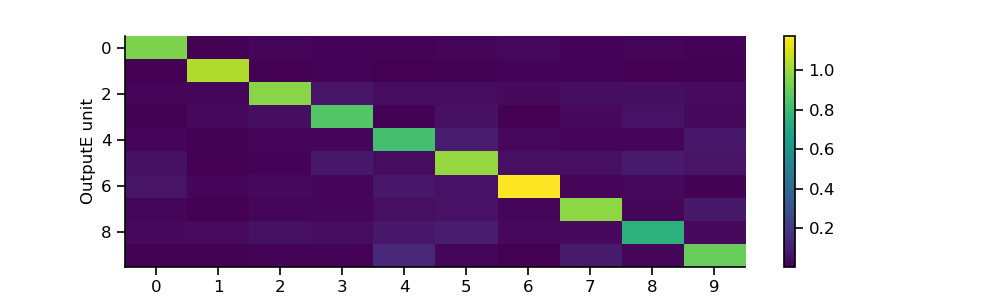

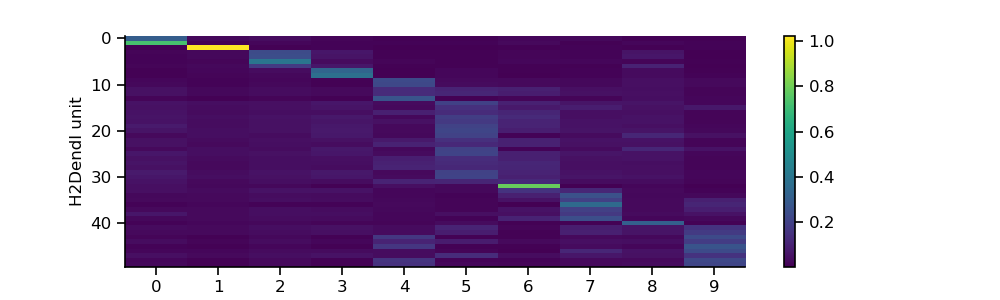

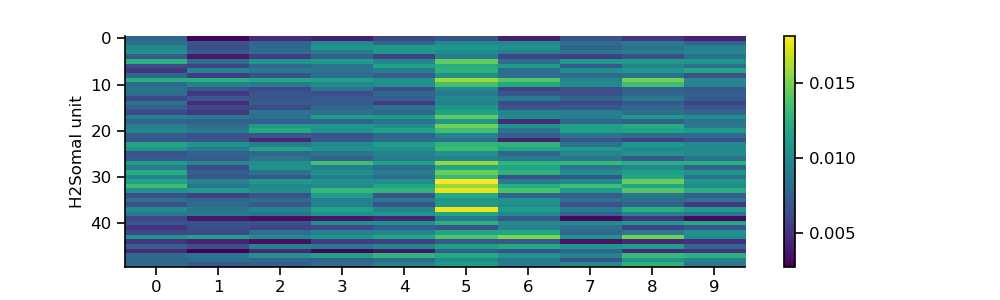

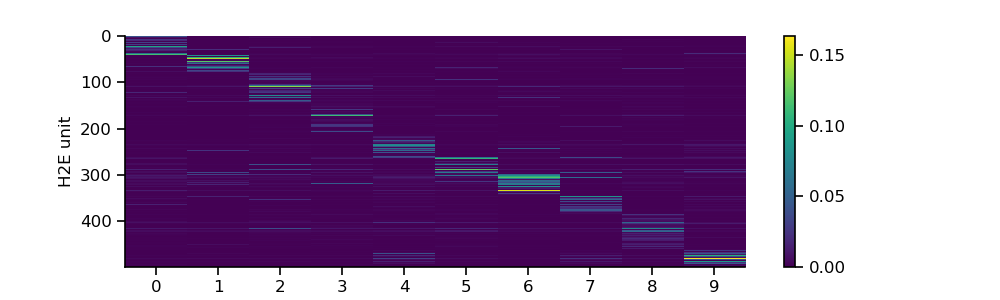

...

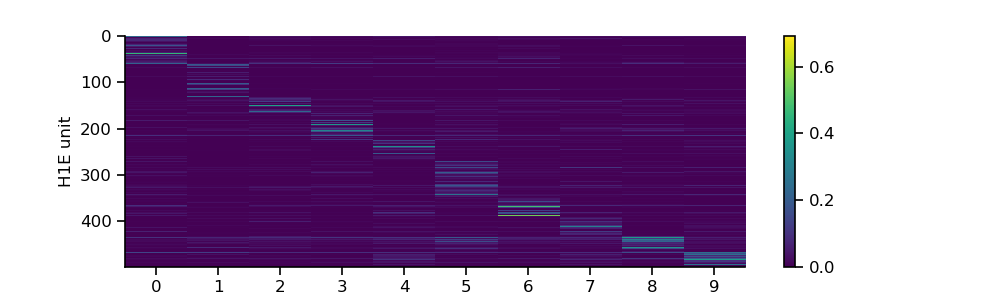

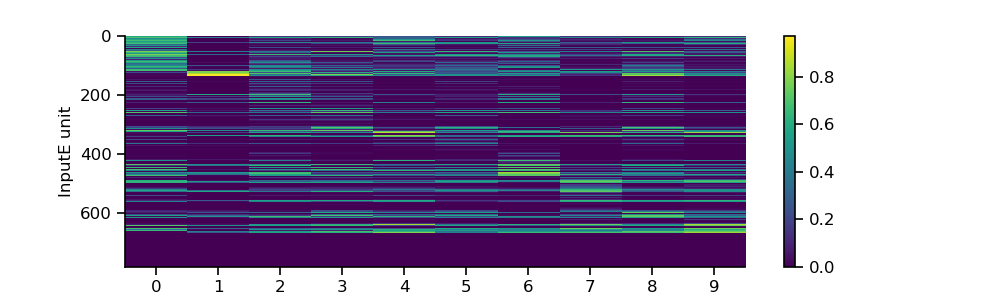

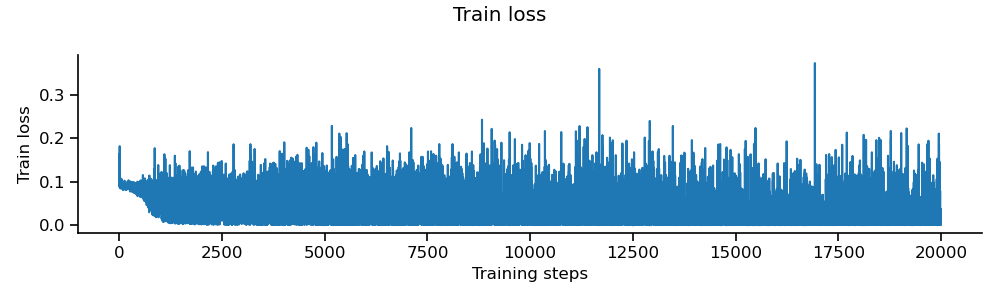

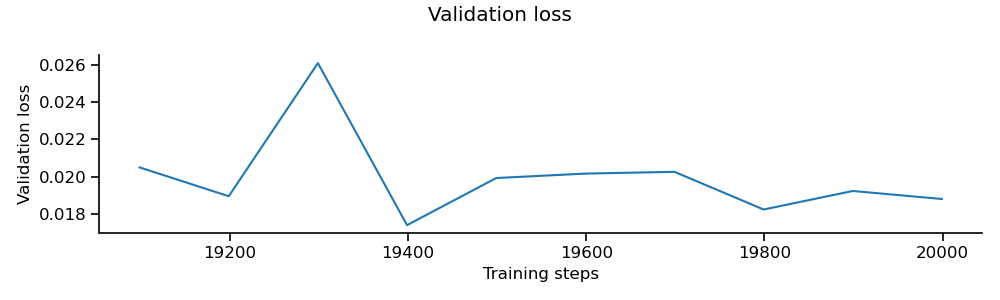

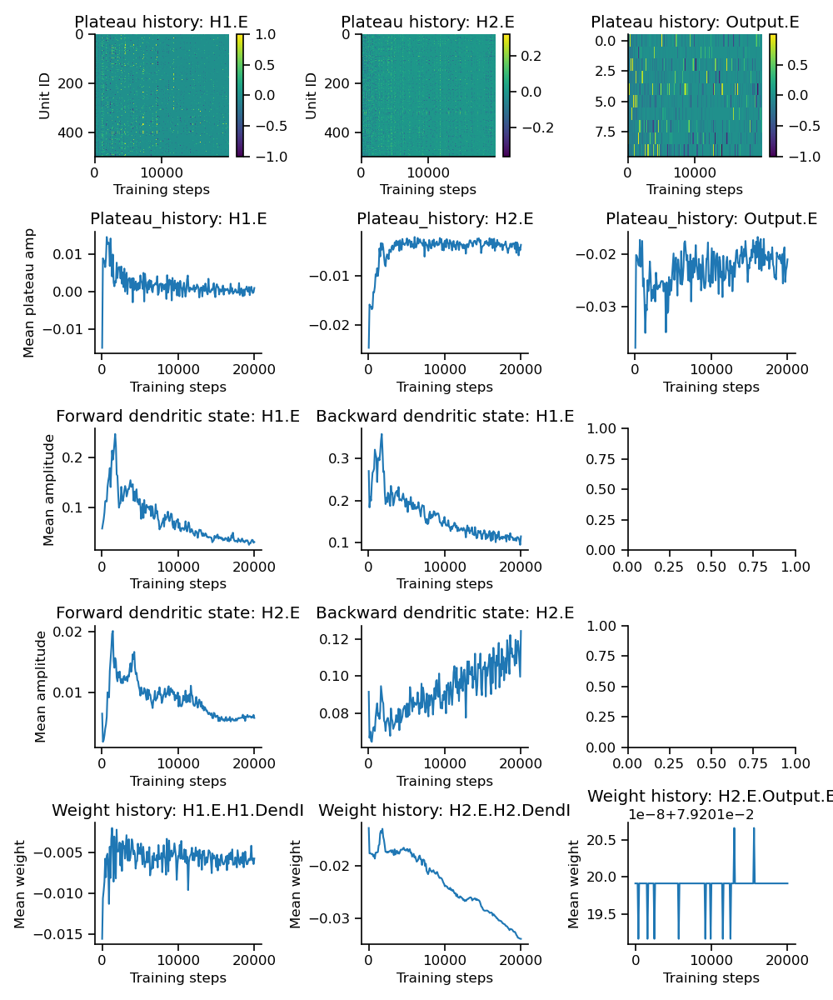

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:08<00:00, 14.70it/s]


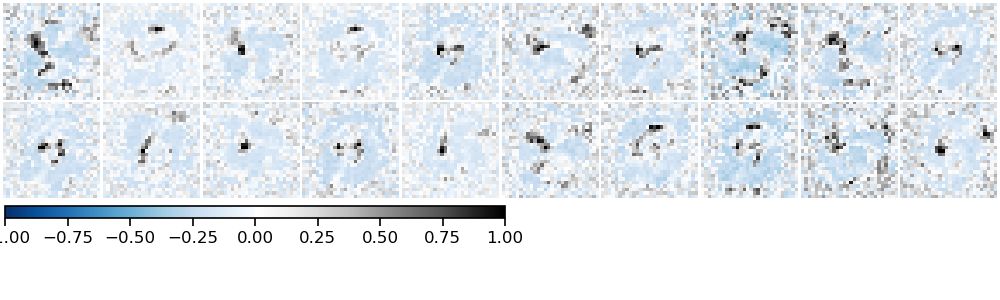

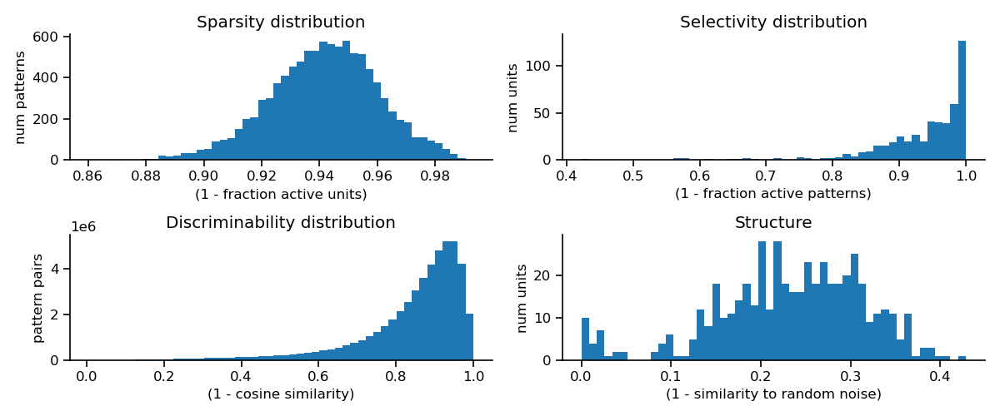

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:10<00:00, 14.18it/s]


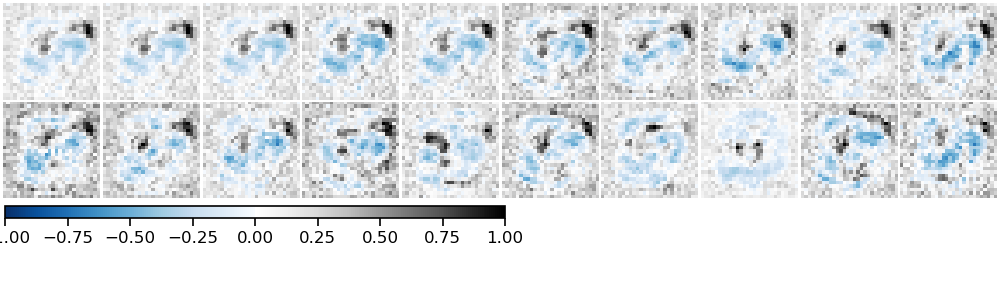

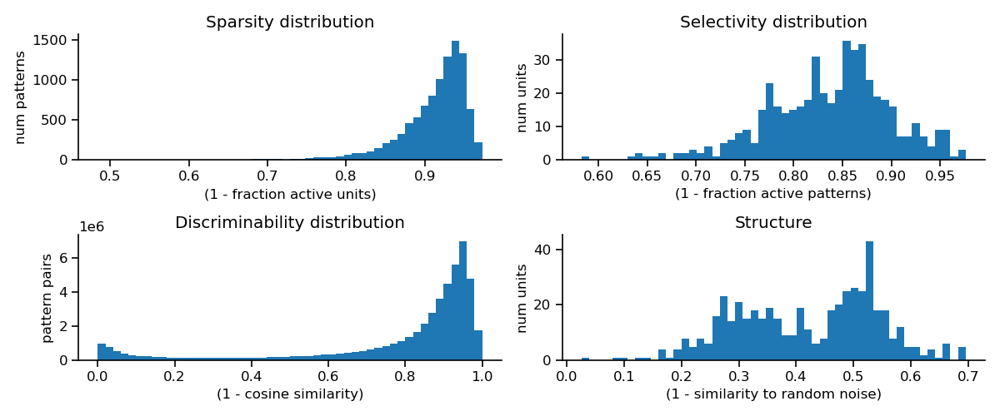

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:14<00:00, 71.24it/s]


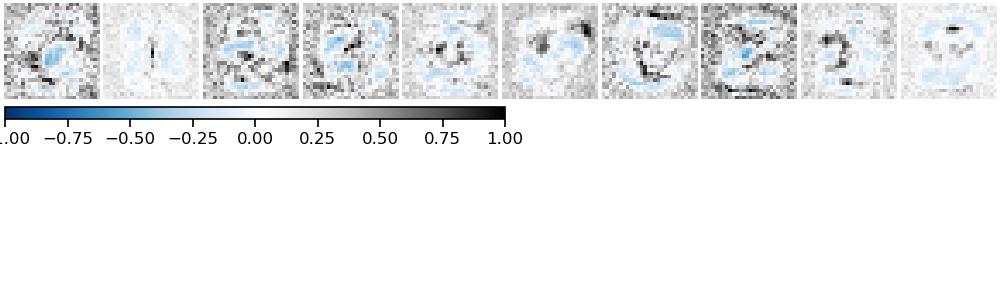

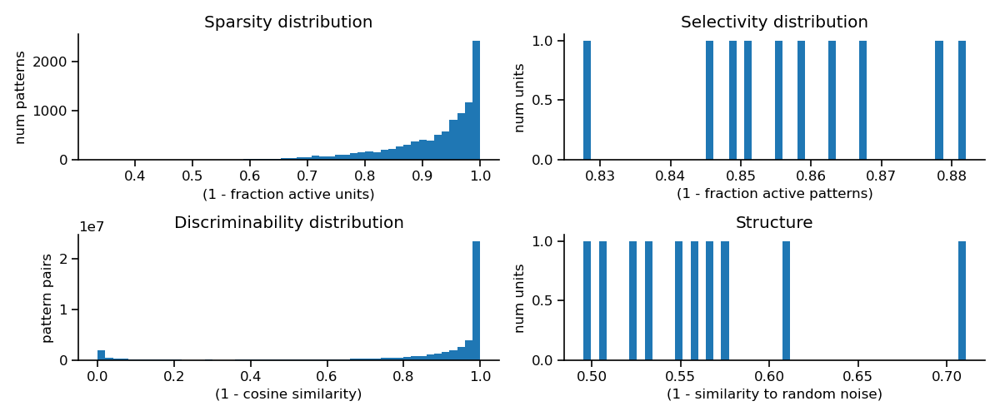

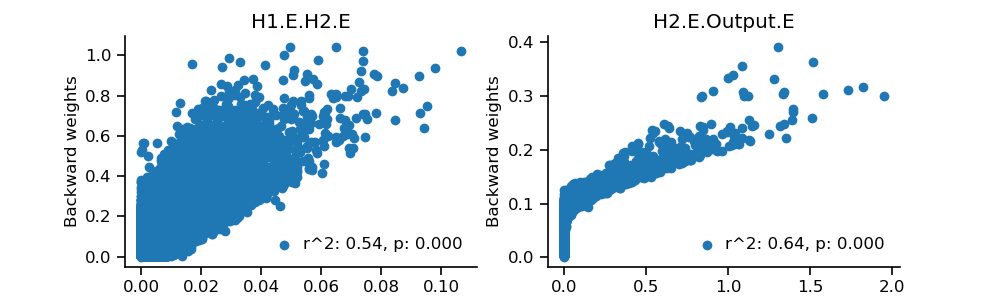

In [14]:
# Create network

config_file_path = '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_2_test_optimized.yaml'
data_file_path = '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_2_66049_257_test.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

BP_like_network_2L_learn_TD_HWN_2 = network

## Dale_BP_like_2L_learn_TD_HWN_3 (dend_EI_gating) (DendI < E/I are learned by Hebb_WeightNorm) (with network-wide equilibration and auxiliary objective to reduce forward_dendritic_state) (top-down weights are learned by Hebb_WeightNorm)

Loading network from '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_3_66049_257_test.pkl'
Network successfully loaded from '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_3_66049_257_test.pkl'
Batch accuracy = 93.30000305175781%


/Users/aaronmil/src/EIANN/EIANN/plot.py:747: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  avg_pop_activity = torch.tensor(avg_pop_activity)


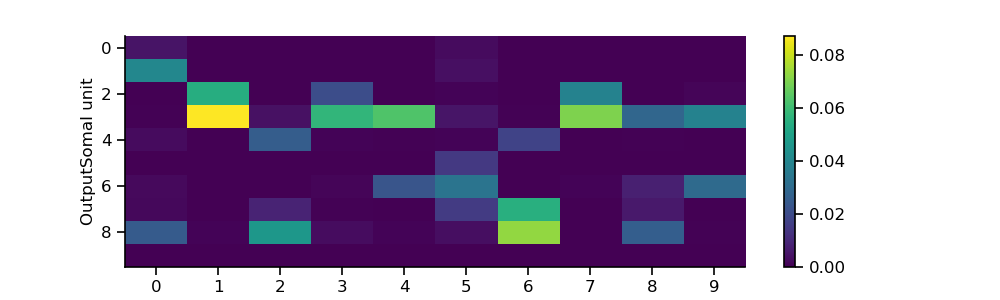

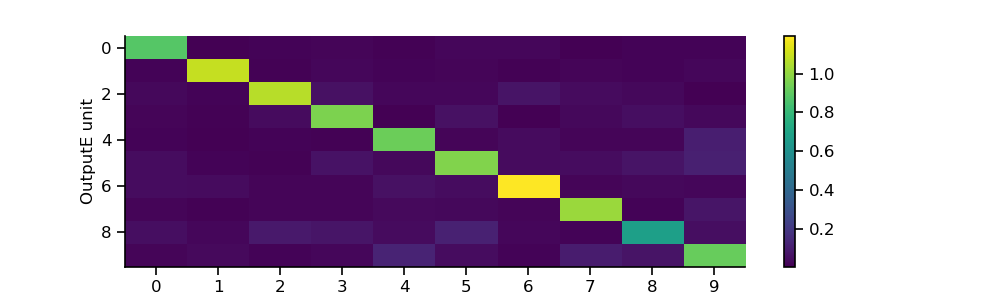

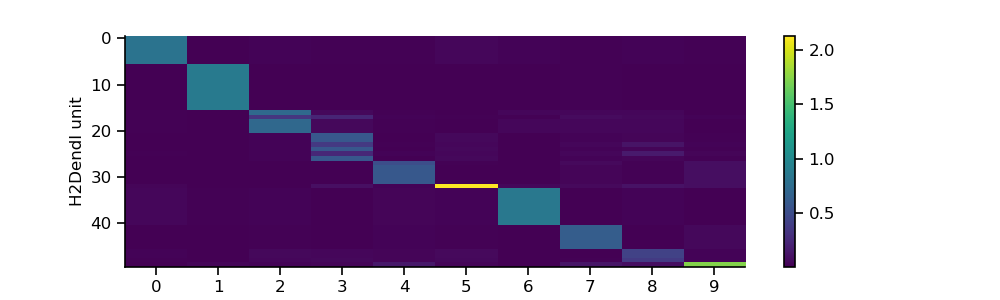

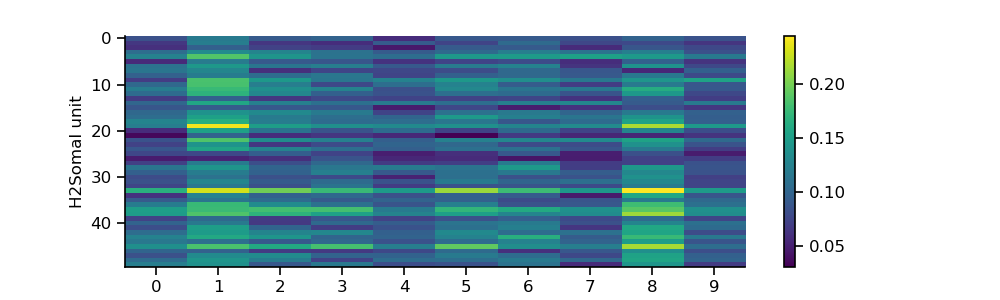

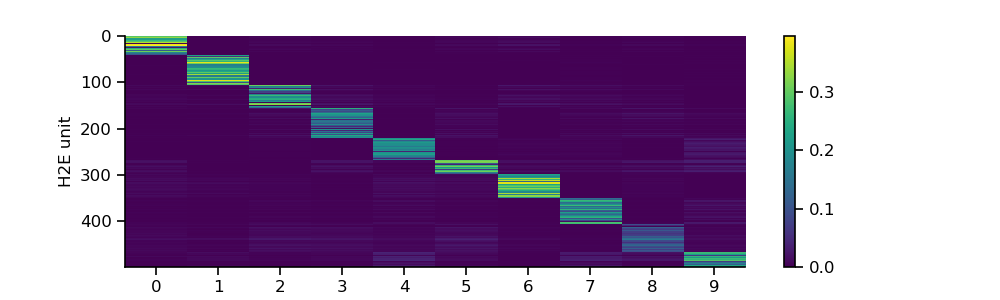

...

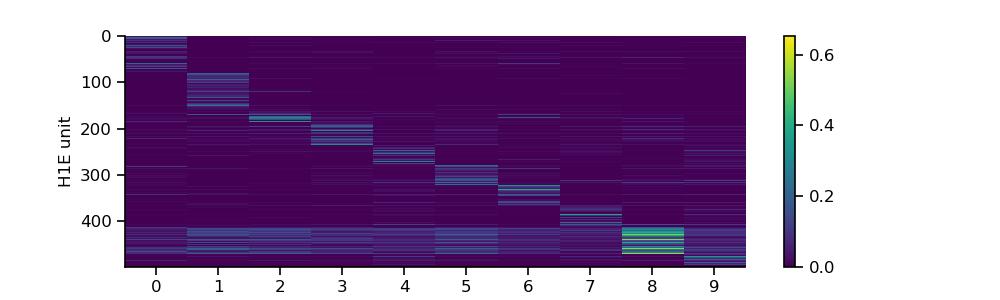

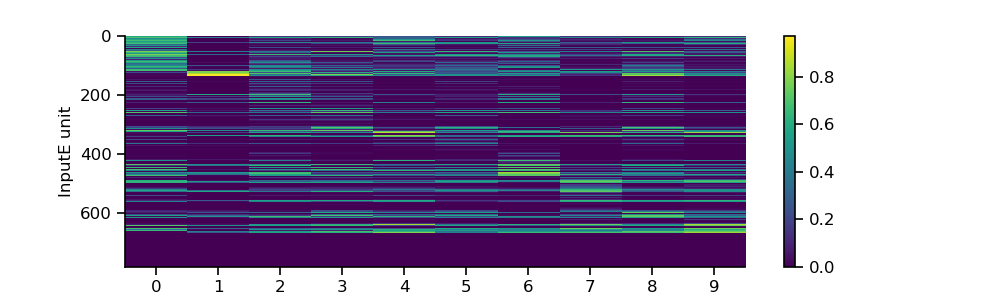

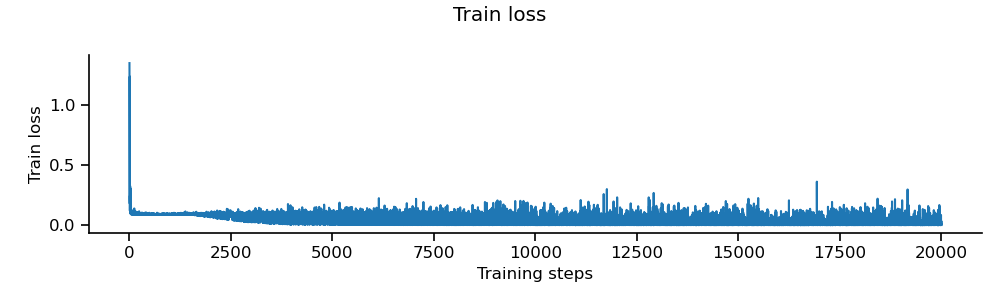

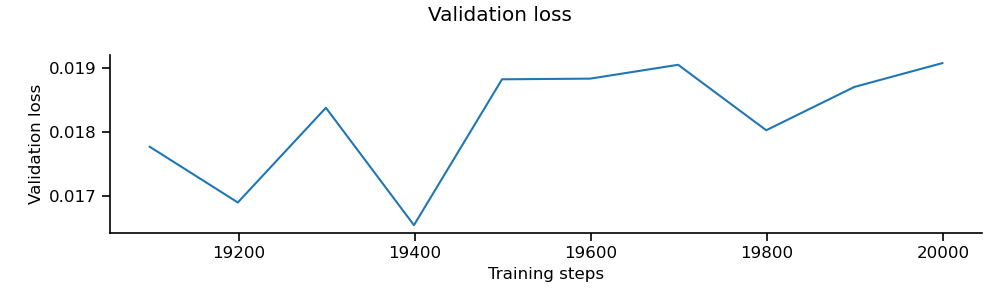

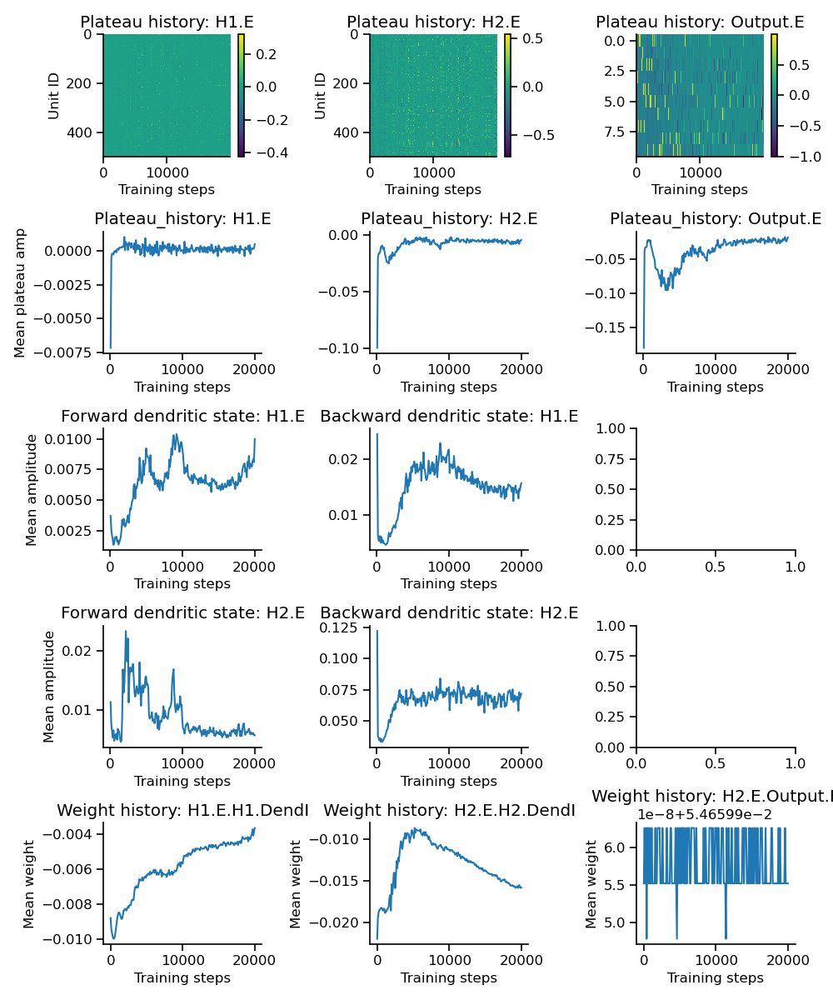

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:06<00:00, 14.95it/s]


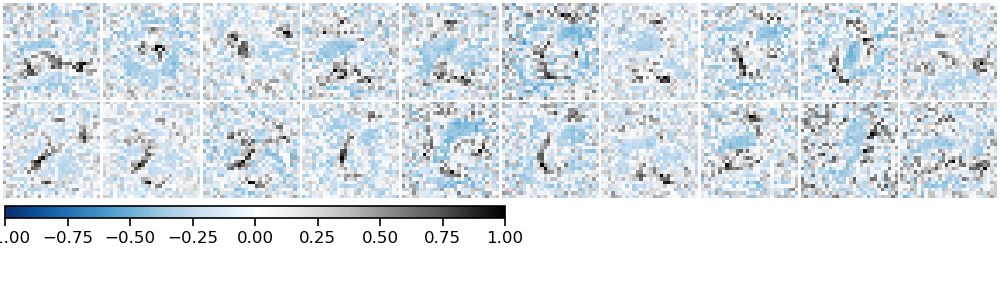

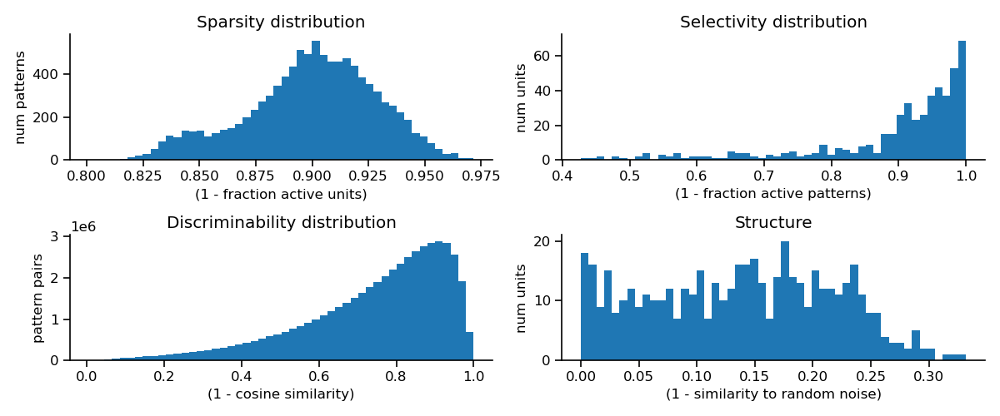

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:07<00:00, 14.71it/s]


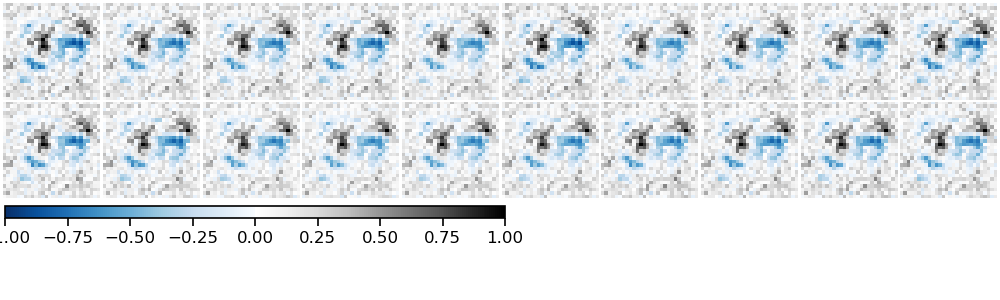

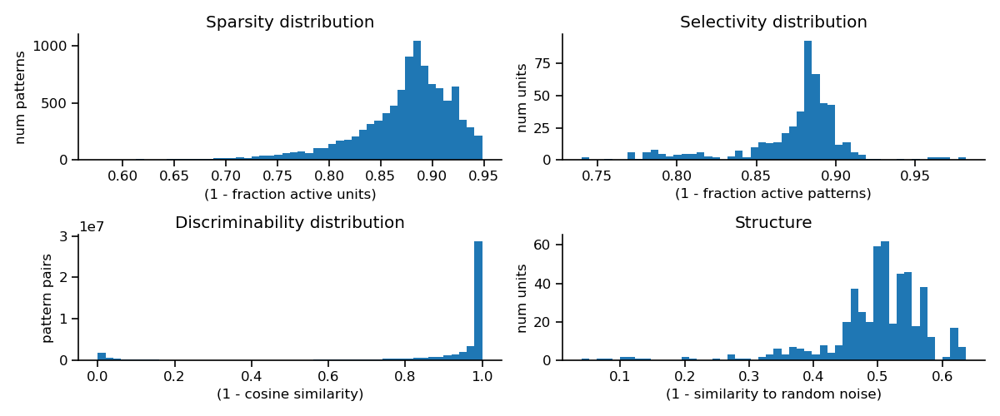

Optimizing receptive field images...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:13<00:00, 75.84it/s]


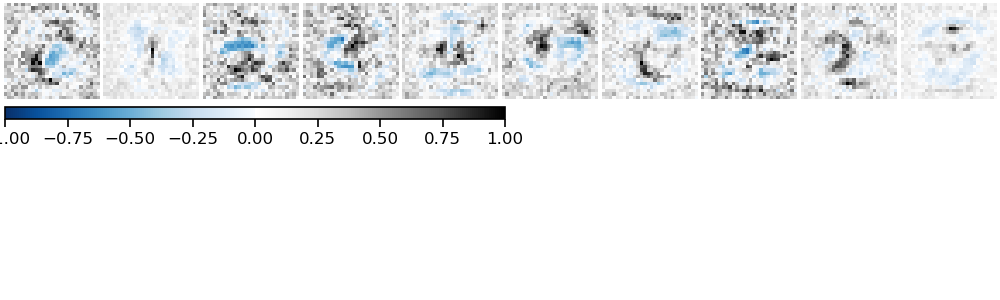

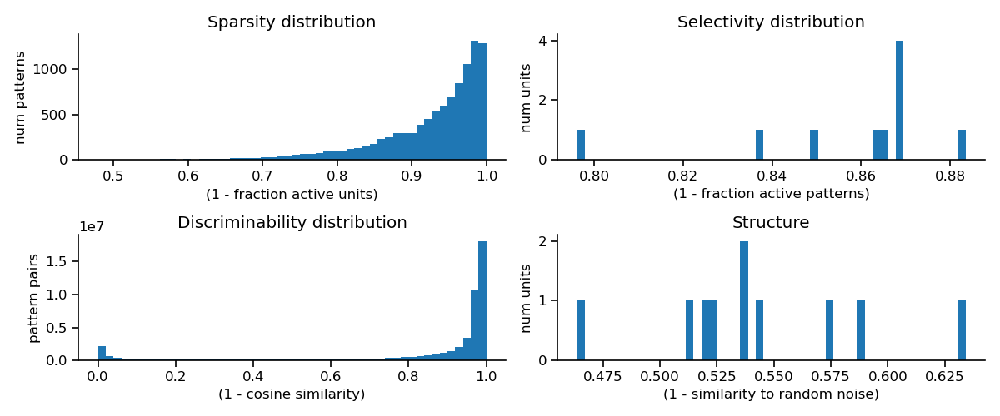

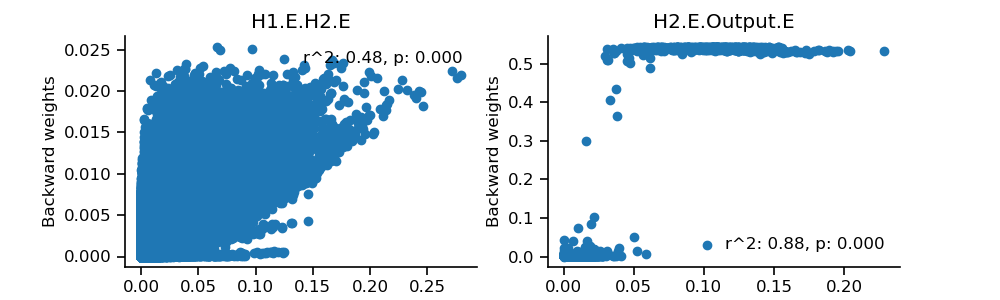

In [13]:
# Create network

config_file_path = '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_3_test_optimized.yaml'
data_file_path = '../data/mnist/20240830_EIANN_2_hidden_mnist_BP_like_config_2L_learn_TD_HWN_3_66049_257_test.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

BP_like_network_2L_learn_TD_HWN_3 = network

## BTSP_3L

Loading network from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl'
Batch accuracy = 91.4800033569336%


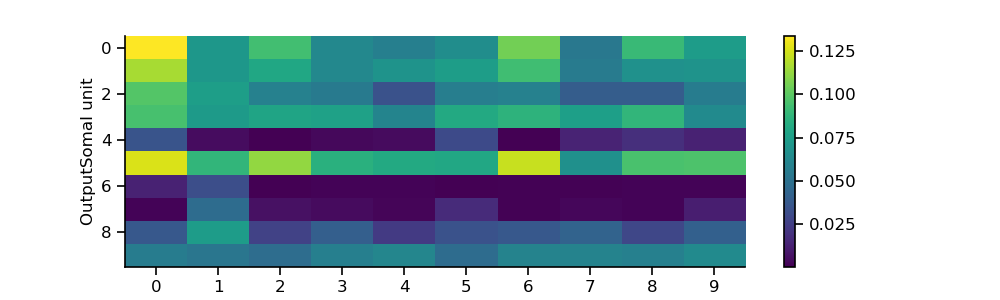

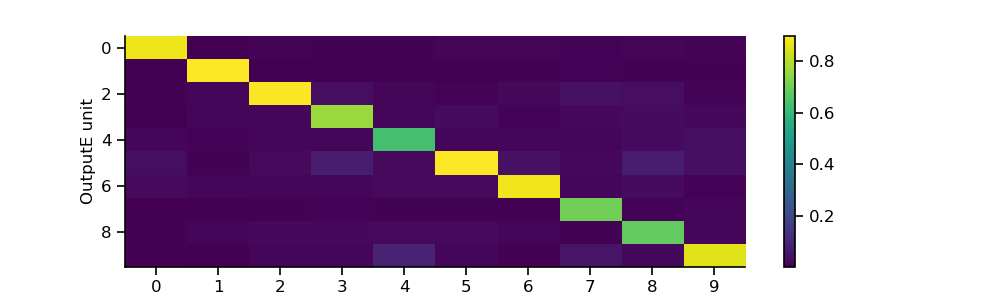

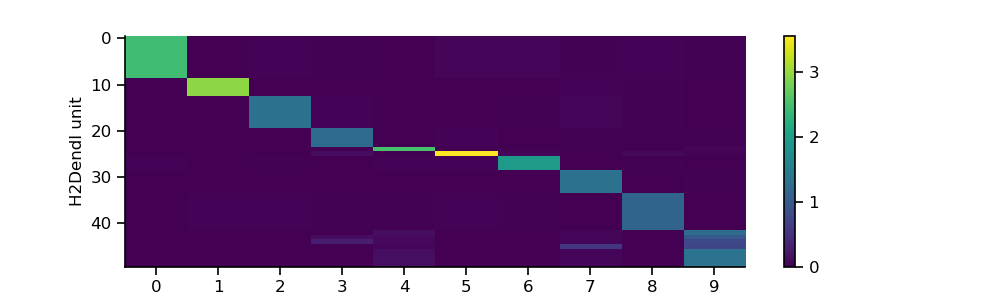

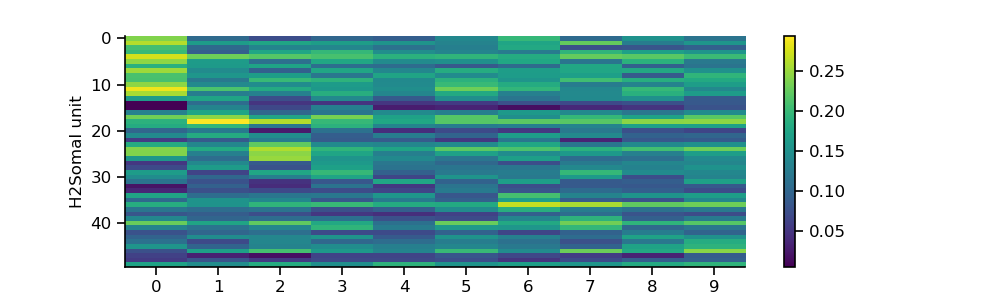

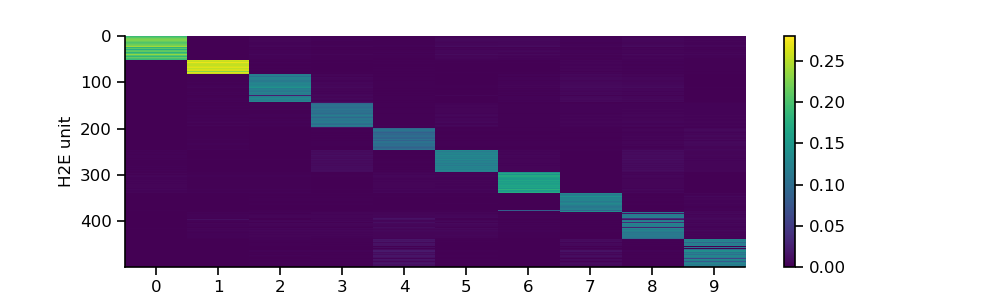

...

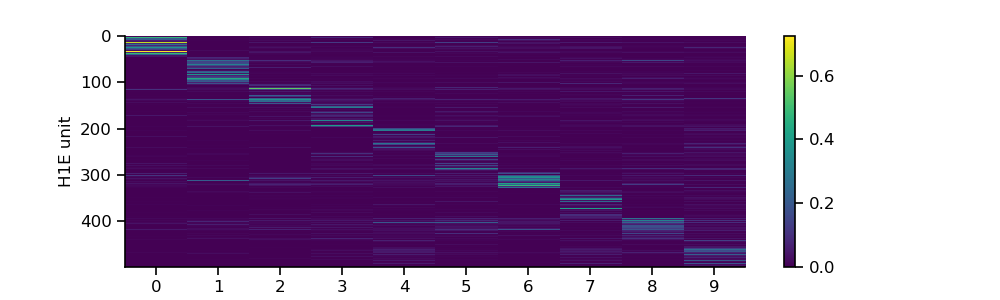

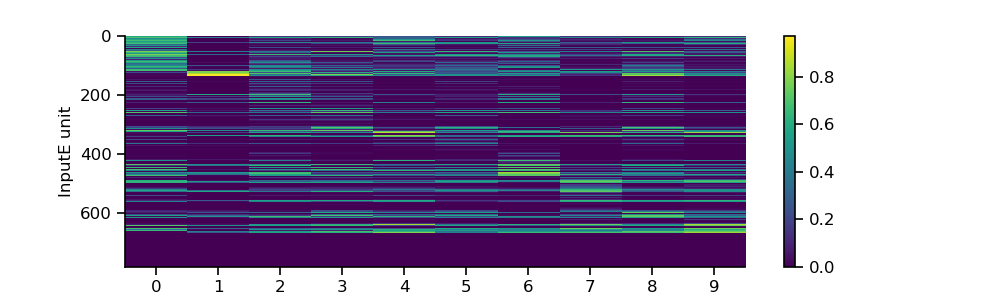

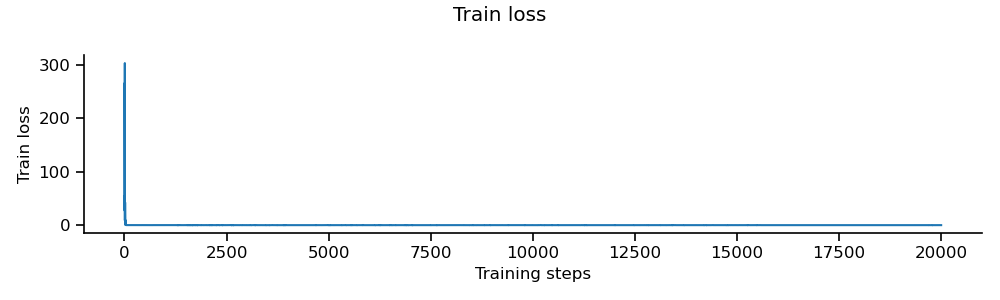

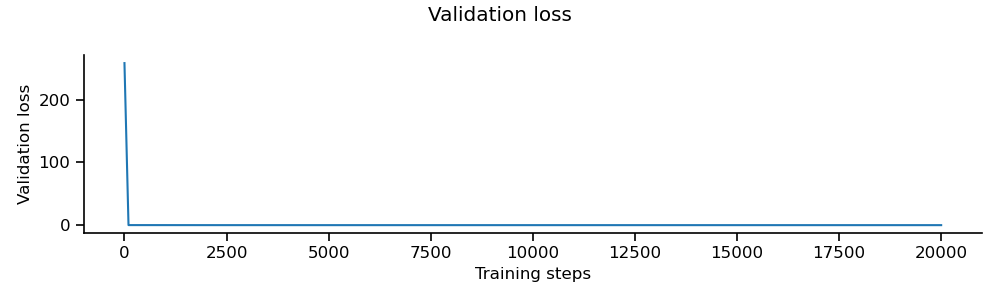

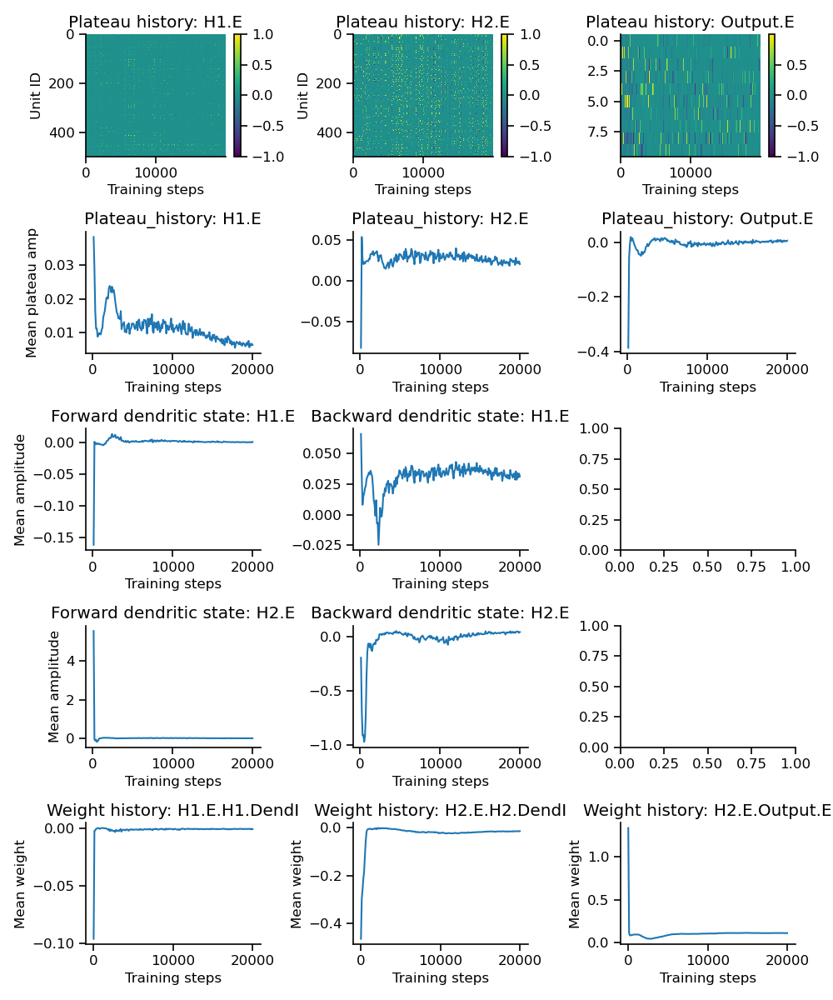

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:01<00:00, 16.28it/s]


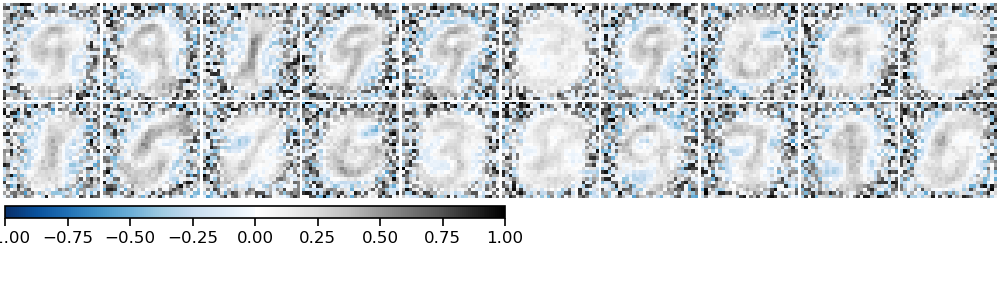

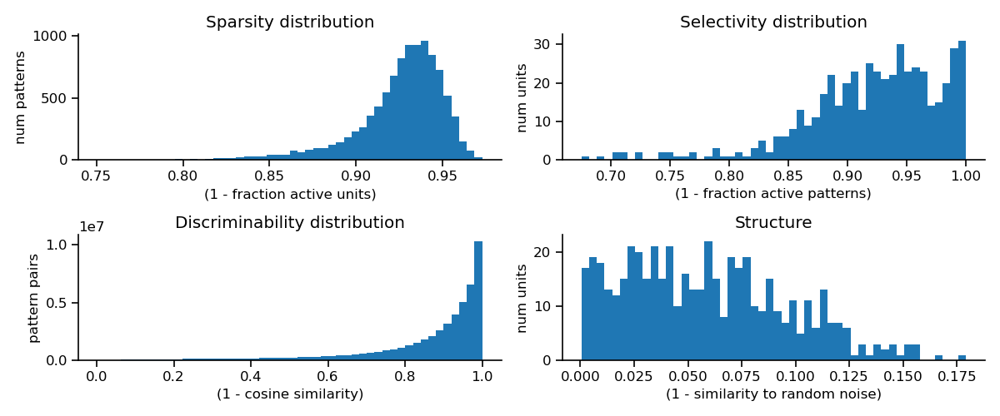

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:10<00:00, 14.28it/s]


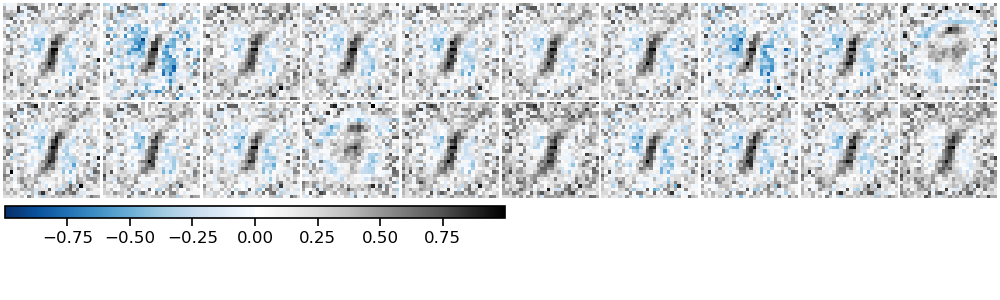

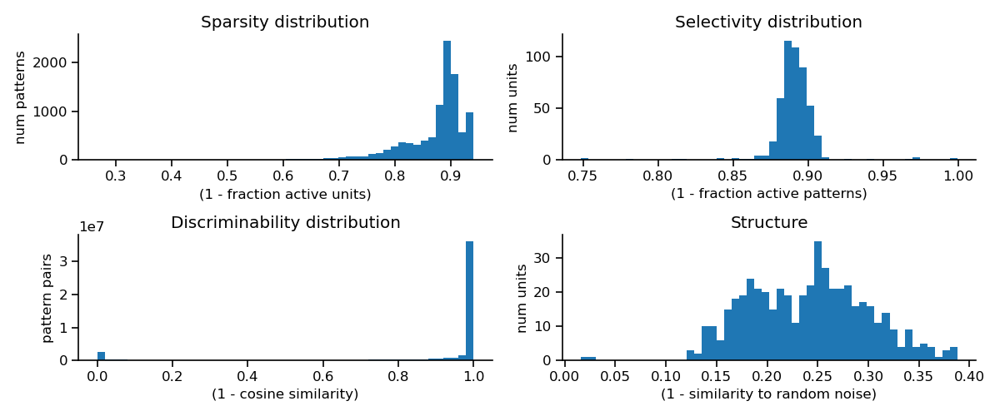

Optimizing receptive field images...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:12<00:00, 78.12it/s]


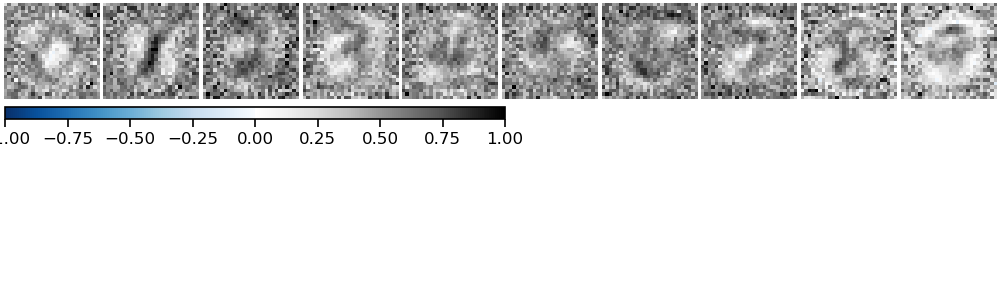

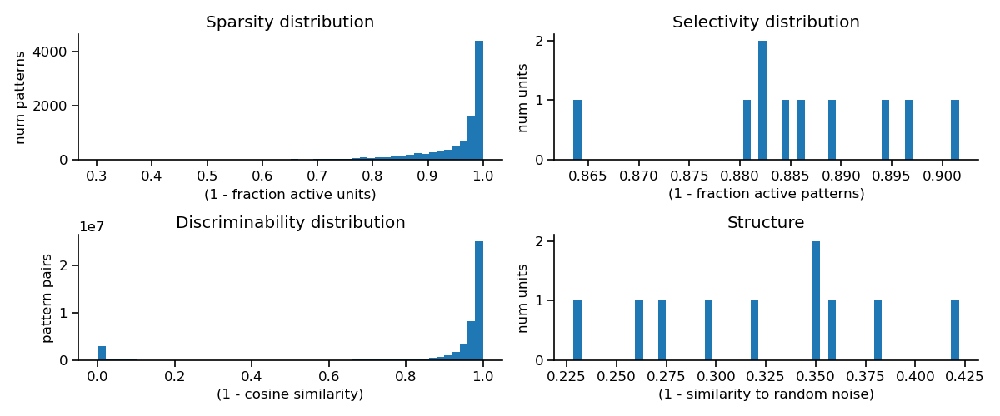

In [8]:
# Create network

config_file_path = '../network_config/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_optimized.yaml'
data_file_path = '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl'

data_generator.manual_seed(data_seed)

network = get_trained_network(config_file_path, network_seed, train_dataloader, val_dataloader, train_steps=20000, 
                              data_file_path=data_file_path)

plot_mnist_network_accuracy(network, test_dataloader, supervised=True)
plot_mnist_network_intermediates(network)

BTSP_network_3L = network

In [11]:
data_dir = '../data/mnist/'
data_file_list_dict = {}
network_list_dict = {}

In [15]:
networks_binned_mean_dend_loss_history_dict = {}

In [71]:
data_file_list_dict['BTSP'] = ['20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl',
'20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66050_258_complete.pkl',
'20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66051_259_complete.pkl',
'20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66052_260_complete.pkl',
'20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66053_261_complete.pkl']}

In [72]:
network_list = []
for data_file in data_file_list_dict['BTSP']:
    data_file_path = '%s%s' % (data_dir, data_file)
    network = ut.load_network(data_file_path)
    network_list.append(network)
network_list_dict = {'BTSP': network_list}

Loading network from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66049_257_complete.pkl'
Loading network from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66050_258_complete.pkl'
Network successfully loaded from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66050_258_complete.pkl'
Loading network from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66051_259_complete.pkl'
Network successfully loaded from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66051_259_complete.pkl'
Loading network from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66052_260_complete.pkl'
Network successfully loaded from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66052_260_complete.pkl'
Loading network from '../data/mnist/20240604_EIANN_2_hidden_mnist_BTSP_config_3L_66053_261_complete.pkl'
Network

In [9]:
def get_binned_mean_population_attribute_history_dict(network, attr_name, bin_size=100, abs=False):
    all_pop_attr_history_list = []
    binned_attr_history_dict = {}
    num_patterns = network.output_pop.activity_history.shape[0]
    num_bins = num_patterns // bin_size
    excess = num_patterns % bin_size
    steps = torch.arange(bin_size, bin_size * (num_bins + 1), bin_size)
    
    for pop_name, pop in network.populations.items():
        attr_history = pop.get_attribute_history(attr_name)
        if attr_history is None:
            continue
        attr_history = attr_history.detach().clone()
        if excess > 0:
            attr_history = attr_history[:-excess]
        num_units = pop.size
        binned_attr_history = attr_history.reshape(num_bins, bin_size, num_units)
        if abs:
            binned_attr_history = torch.abs(binned_attr_history)
        binned_attr_history = torch.mean(binned_attr_history, dim=1)
        all_pop_attr_history_list.append(binned_attr_history)
        binned_attr_history_dict[pop_name] = torch.mean(binned_attr_history, dim=1)
    
    binned_attr_history_tensor = torch.concatenate(all_pop_attr_history_list, dim=1)
    binned_attr_history_dict['all'] = torch.mean(binned_attr_history_tensor, dim=1)
    return steps, binned_attr_history_dict

In [103]:
binned_mean_dend_loss_history_list = []
for network in network_list_dict['BTSP']:
    steps, binned_mean_dend_loss_history_dict = get_binned_mean_population_attribute_history_dict(network, 'forward_dendritic_state', abs=True)
    binned_mean_dend_loss_history_list.append(binned_mean_dend_loss_history_dict['all'])
networks_binned_mean_dend_loss_history_dict = {'BTSP': torch.stack(binned_mean_dend_loss_history_list)}

In [14]:
data_file_list_dict['BP_like_fixed_DendI'] = ['20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66049_257_complete.pkl',
'20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66050_258_complete.pkl',
'20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66051_259_complete.pkl',
'20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66052_260_complete.pkl',
'20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66053_261_complete.pkl']

network_list = []
for data_file in data_file_list_dict['BP_like_fixed_DendI']:
    data_file_path = '%s%s' % (data_dir, data_file)
    network = ut.load_network(data_file_path)
    network_list.append(network)

network_list_dict['BP_like_fixed_DendI'] = network_list

Loading network from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66049_257_complete.pkl'
Network successfully loaded from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66049_257_complete.pkl'
Loading network from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66050_258_complete.pkl'
Network successfully loaded from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66050_258_complete.pkl'
Loading network from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66051_259_complete.pkl'
Network successfully loaded from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66051_259_complete.pkl'
Loading network from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66052_260_complete.pkl'
Network successfully loaded from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_66052_260_complete.pkl'
Loading network from '../data/mnist/20240508_EIANN_2_hidden_mnist_BP_like_config_2K_6605

In [16]:
binned_mean_dend_loss_history_list = []
for network in network_list_dict['BP_like_fixed_DendI']:
    steps, binned_mean_dend_loss_history_dict = get_binned_mean_population_attribute_history_dict(network, 'forward_dendritic_state', 
                                                                                                  abs=True)
    binned_mean_dend_loss_history_list.append(binned_mean_dend_loss_history_dict['all'])
networks_binned_mean_dend_loss_history_dict['BP_like_fixed_DendI'] = torch.stack(binned_mean_dend_loss_history_list)

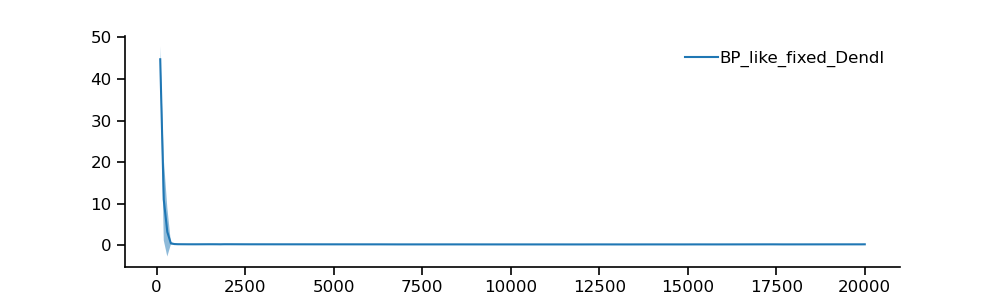

In [51]:
fig = plt.figure()
for label, binned_mean_dend_loss_history_tensor in networks_binned_mean_dend_loss_history_dict.items():
    mean_dend_state_history = torch.mean(binned_mean_dend_loss_history_tensor, dim=0)
    mean_dend_state_history_std = torch.std(binned_mean_dend_loss_history_tensor, dim=0, unbiased=True)
    plt.plot(steps, mean_dend_state_history, label=label)
    plt.fill_between(steps, mean_dend_state_history-mean_dend_state_history_std, mean_dend_state_history+mean_dend_state_history_std, 
                     alpha=0.5)
plt.legend(loc='best', frameon=False)
fig.show()